In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import necessary packages - Kullanılması gereken kütüphaneler
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import exposure
%matplotlib inline
import os
import seaborn as sns
import random
sns.set()

In [ ]:
# Veri setini çektiğimiz link
#!git clone https://github.com/hardik0/AI-for-Medicine-Specialization
#%cd /AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/

Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 24.88 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
[Errno 2] No such file or directory: '/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/'
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis


In [ ]:
%ls /content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/

densenet.hdf5  pretrained_model.h5        test.csv         valid-small.csv
images_small/  selected_randomimages.txt  train-small.csv


**Bu csv dosyasındaki çeşitli sütunlar dikkat çekicidir. İlgili dosyada, göğüs röntgeni görüntülerinin adları "Görüntü" sütununda bulunmaktadır. Bu sütunlar birler ve sıfırlarla dolu sütunlardır, her röntgen görüntüsüne göre hangi tanıların verildiğini belirtir.**

In [ ]:
# Read csv file containing training datadata - Eğitilmiş verileri okuma işlemi
train_df = pd.read_csv("/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/train-small.csv")
# Print first 5 rows
print(f'There are {train_df.shape[0]} rows and {train_df.shape[1]} columns in this data frame')
train_df.head()

There are 1000 rows and 16 columns in this data frame


,Image,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,PatientId,Pleural_Thickening,Pneumonia,Pneumothorax
0,00008270_015.png,0,0,0,0,0,0,0,0,0,0,0,8270,0,0,0
1,00029855_001.png,1,0,0,0,1,0,0,0,1,0,0,29855,0,0,0
2,00001297_000.png,0,0,0,0,0,0,0,0,0,0,0,1297,1,0,0
3,00012359_002.png,0,0,0,0,0,0,0,0,0,0,0,12359,0,0,0
4,00017951_001.png,0,0,0,0,0,0,0,0,1,0,0,17951,0,0,0


**Data types and null values check - Veri Tipleri ve Boş değerler kontrolü**

In [ ]:
# Her sütunun veri türüne ve boş değerlerin mevcut olup olmadığına bakılır
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Image               1000 non-null   object
 1   Atelectasis         1000 non-null   int64 
 2   Cardiomegaly        1000 non-null   int64 
 3   Consolidation       1000 non-null   int64 
 4   Edema               1000 non-null   int64 
 5   Effusion            1000 non-null   int64 
 6   Emphysema           1000 non-null   int64 
 7   Fibrosis            1000 non-null   int64 
 8   Hernia              1000 non-null   int64 
 9   Infiltration        1000 non-null   int64 
 10  Mass                1000 non-null   int64 
 11  Nodule              1000 non-null   int64 
 12  PatientId           1000 non-null   int64 
 13  Pleural_Thickening  1000 non-null   int64 
 14  Pneumonia           1000 non-null   int64 
 15  Pneumothorax        1000 non-null   int64 
dtypes: int64(15), object(1)
m

**Unique IDs check - Benzersiz Kimlik kontrolü işlemi**

**"PatientId" has an identification number for each patient. One thing you'd like to know about a medical dataset like this is if you're
looking at repeated data for certain patients or whether each image represents a different person.**

---

"PatientId" her hasta için bir kimlik numarasına sahiptir. Bu tür bir tıbbi veri kümesi hakkında bilmek isteyeceğiniz bir şey. Belirli hastalar için tekrarlanan veriler varsa her bir görüntünün farklı bir kişiyi temsil edip etmediğini kontrol etmeliyiz.

In [ ]:
print(f"The total patient ids are {train_df['PatientId'].count()}, from those the unique ids are {train_df['PatientId'].nunique()}")

The total patient ids are 1000, from those the unique ids are 928


**As you can see, the number of unique patients in the dataset is less than the total number so there must be some overlap. For patients with multiple records, you'll want to make sure they do not show up in both training and test sets in order to avoid data**

---

Göründüğü gibi, veri kümesindeki benzersiz hasta sayısı toplam sayıdan azdır. Bu nedenle bir miktar örtüşme olmalıdır. Birden fazla kaydı olan hastalar için, veri çakışmasını önlemek amacıyla hem eğitim hem de test kümelerinde görünmediklerinden emin olmak gerekmektedir.

**Explore data labels**

---
Veri etiket keşfi yapmak gerekmektedir.
Her hastanın durumu veya hastalığının adlarını içeren bir liste oluşturmak aşağıdaki kodu çalıştırmamız gerekiyor.

In [ ]:
columns = train_df.keys()
columns = list(columns)
print(columns)

['Image', 'Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'PatientId', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


In [ ]:
# Remove unnecesary elements - Gereksiz alanları kaldırma işlemi
columns.remove('Image')
columns.remove('PatientId')
# Get the total classes - Veri setindeki Toplam sınıfları görme işlemi
print(f"There are {len(columns)} columns of labels for these conditions: {columns}")

There are 14 columns of labels for these conditions: ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


**Run the next cell to print out the number of positive labels (1's) for each condition**

---

Her koşul için pozitif etiket sayısını (1'ler için) yazdırma işlemi

In [ ]:
for column in columns:
    print(f"The class {column} has {train_df[column].sum()} samples")

The class Atelectasis has 106 samples
The class Cardiomegaly has 20 samples
The class Consolidation has 33 samples
The class Edema has 16 samples
The class Effusion has 128 samples
The class Emphysema has 13 samples
The class Fibrosis has 14 samples
The class Hernia has 2 samples
The class Infiltration has 175 samples
The class Mass has 45 samples
The class Nodule has 54 samples
The class Pleural_Thickening has 21 samples
The class Pneumonia has 10 samples
The class Pneumothorax has 38 samples


**Have a look at the counts for the labels in each class above. Does this look like a balanced dataset?**

---

Bu veri seti dengeli bir veri seti değildir. Sınıflar arasındaki örnek sayıları önemli ölçüde farklılık göstermektedir. Örneğin, 'Hernia' sınıfında sadece 2 örnek varken, 'Infiltration' sınıfında 175 örnek bulunmaktadır. Bu tür dengesizlikler, makine öğrenimi modellerinin bazı sınıfları yeterince öğrenememesine ve tahmin performansının düşmesine yol açabilmektedir. Bu durum Yanlış hastalık tanımına yol açmak ile birlikte modeli eğitmede yanlış bir öğrenim durumuna sebebiyet verir.

**Sınıfların örnek sayıları üzerinden oluşturulan BoxPlot Grafiği**

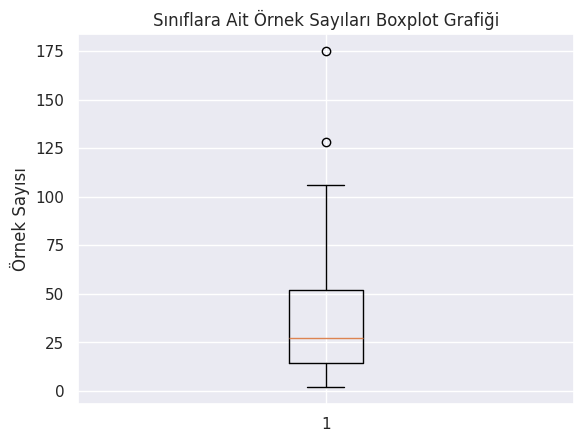

In [ ]:
# Sınıf isimleri ve örnek sayıları
classes = [
    'Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion',
    'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule',
    'Pleural_Thickening', 'Pneumonia', 'Pneumothorax'
]

sample_counts = [106, 20, 33, 16, 128, 13, 14, 2, 175, 45, 54, 21, 10, 38]

# Boxplot oluşturma
plt.boxplot(sample_counts, vert=True)

# Grafiğe başlık ve eksen isimleri ekleme
plt.title('Sınıflara Ait Örnek Sayıları Boxplot Grafiği')
plt.ylabel('Örnek Sayısı')

# Grafiği gösterme
plt.show()


**Her bir sınıf için sınıfların dağılımını gösteren BoxPlot çıktısı**

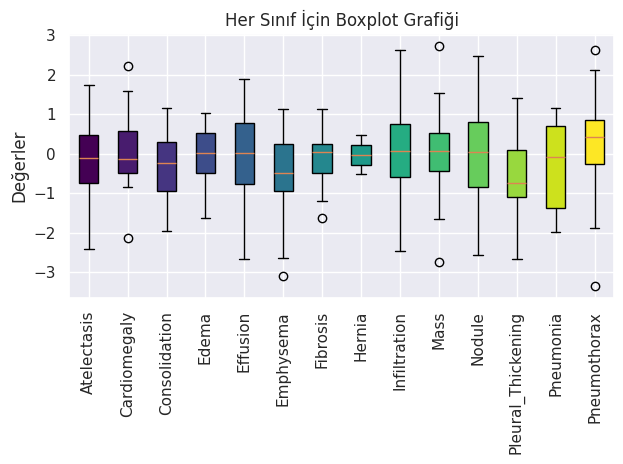

In [ ]:
# Her sınıf için örnek sayıları içeren veriler (örnek olarak random değerler)
import numpy as np
data = [np.random.randn(n) for n in sample_counts]

# Boxplot oluşturma ve renklendirme
fig, ax = plt.subplots()

box = ax.boxplot(data, patch_artist=True)

# Renkleri belirleme (her sınıf için farklı renkler)
colors = plt.cm.viridis(np.linspace(0, 1, len(data)))

# Kutuları renklendirme
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)

# X eksenine sınıf isimlerini ekleme
ax.set_xticklabels(classes, rotation=90)

# Grafiğe başlık ve eksen isimleri ekleme
ax.set_title('Her Sınıf İçin Boxplot Grafiği')
ax.set_ylabel('Değerler')

# Grafiği gösterme
plt.tight_layout()
plt.show()

**Data Visualization**

**Görüntü veri setinden önce rastgele 9 resim seçilmiş olup, seçtiğimiz 9 farklı resim için resim sabitleme işlemi yapılmıştır**

---

**Önemli !!** Aşağıdaki kod parçacığı tekrar çalıştırılırsa sabitlenen 9 resimde değişiklik olacaktır.

In [ ]:
# # DataFrame'den Image sütununu numpy array olarak alıyoruz
# images = train_df['Image'].values

# # Resimlerin bulunduğu dizin
# img_dir = '/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/images_small'

# # Seçilen resimleri kaydedeceğimiz dosyanın adı
# selected_images_file = '/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/selected_randomimages.txt'

# # Eğer seçilen resimler daha önce kaydedilmişse, dosyadan yükle
# if os.path.exists(selected_images_file):
#     with open(selected_images_file, 'r') as f:
#         # Dosyadan her satırı okuyup listeye ekliyoruz
#         random_images = [line.strip() for line in f.readlines()]
#     print("Seçilen resimler dosyadan yüklendi.")
# else:
#     # 9 rastgele resmi seç
#     random_images = [np.random.choice(images) for _ in range(9)]
#     # Seçilen resimleri dosyaya kaydet
#     with open(selected_images_file, 'w') as f:
#         for image_name in random_images:
#             f.write(f"{image_name}\n")
#     print("Rastgele seçilen resimler kaydedildi.")

Seçilen resimler dosyadan yüklendi.


**Sabitlediğimiz resimlerin çıktısını görebildiğimiz kod**

Seçilen resimler dosyadan yüklendi.


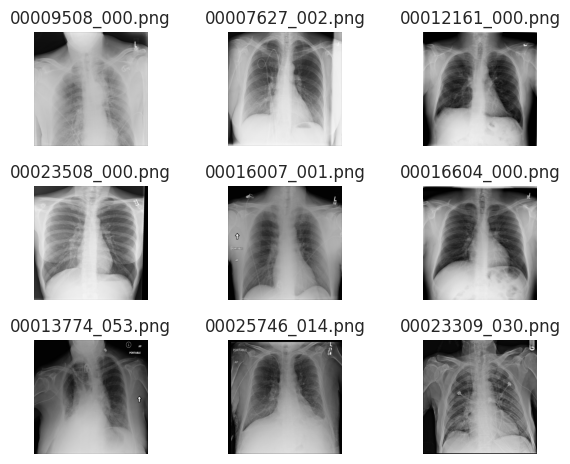

In [ ]:
# Resimlerin bulunduğu dizin
img_dir = '/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/images_small'

# # DataFrame'den Image sütununu numpy array olarak alıyoruz
# images = train_df['Image'].values

# Seçilen resimleri kaydedeceğimiz dosyanın adı
selected_images_file = '/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/selected_randomimages.txt'

# Eğer seçilen resimler daha önce kaydedilmişse, dosyadan yükle
if os.path.exists(selected_images_file):
    with open(selected_images_file, 'r') as f:
        # Dosyadan her satırı okuyup listeye ekliyoruz
        random_images = [line.strip() for line in f.readlines()]
    print("Seçilen resimler dosyadan yüklendi.")
else:
    # This part of the code seems dependent on a DataFrame that's not defined.
    # Assuming `images` is a list of image names, if not replace with your source of image names.
    # images = ... your source of image file names here
    # 9 rastgele resmi seç
    random_images = [np.random.choice(images) for _ in range(9)]
    # Seçilen resimleri dosyaya kaydet
    with open(selected_images_file, 'w') as f:
        for image_name in random_images:
            f.write(f"{image_name}\n")
    print("Rastgele seçilen resimler kaydedildi.")

# Resimleri yükleyip gösterelim
for idx, image_name in enumerate(random_images): # Iterate through the image file names
    img_path = os.path.join(img_dir, image_name)  # Use the correct image directory
    image = cv2.imread(img_path)

    # Check if image was loaded successfully
    if image is not None:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # OpenCV BGR formatında yükler, RGB'ye çeviriyoruz

        plt.subplot(3, 3, idx+1)
        plt.imshow(image)
        plt.title(image_name)
        plt.axis('off')
    else:
        print(f"Image not found: {img_path}")

plt.tight_layout()
plt.show()

**RASTGELE SECİLMİŞ 9 GÖRÜNTÜNÜN ISTATISTIKSEL ÖZELLİKLERİNİ (MAKSIMUM, MINIMUM, MEAN VE STD) HESAPLAYIN.
ORNEK OLARAK BIR GORUNTU ICIN HESAPLAMA YAPILMISTIR**


Image: 00009508_000.png
Dimensions: 1024x1024 pixels
Max pixel value: 0.9569
Min pixel value: 0.0235
Mean pixel value: 0.6310
Standard deviation: 0.1947

Image: 00007627_002.png
Dimensions: 1024x1024 pixels
Max pixel value: 1.0000
Min pixel value: 0.0078
Mean pixel value: 0.6537
Standard deviation: 0.2316

Image: 00012161_000.png
Dimensions: 1024x1024 pixels
Max pixel value: 0.9569
Min pixel value: 0.0000
Mean pixel value: 0.4632
Standard deviation: 0.2720

Image: 00023508_000.png
Dimensions: 1024x1024 pixels
Max pixel value: 1.0000
Min pixel value: 0.0000
Mean pixel value: 0.6045
Standard deviation: 0.2502

Image: 00016007_001.png
Dimensions: 1024x1024 pixels
Max pixel value: 1.0000
Min pixel value: 0.0000
Mean pixel value: 0.4644
Standard deviation: 0.2014

Image: 00016604_000.png
Dimensions: 1024x1024 pixels
Max pixel value: 0.9608
Min pixel value: 0.0000
Mean pixel value: 0.5039
Standard deviation: 0.2513

Image: 00013774_053.png
Dimensions: 1024x1024 pixels
Max pixel value: 1.000

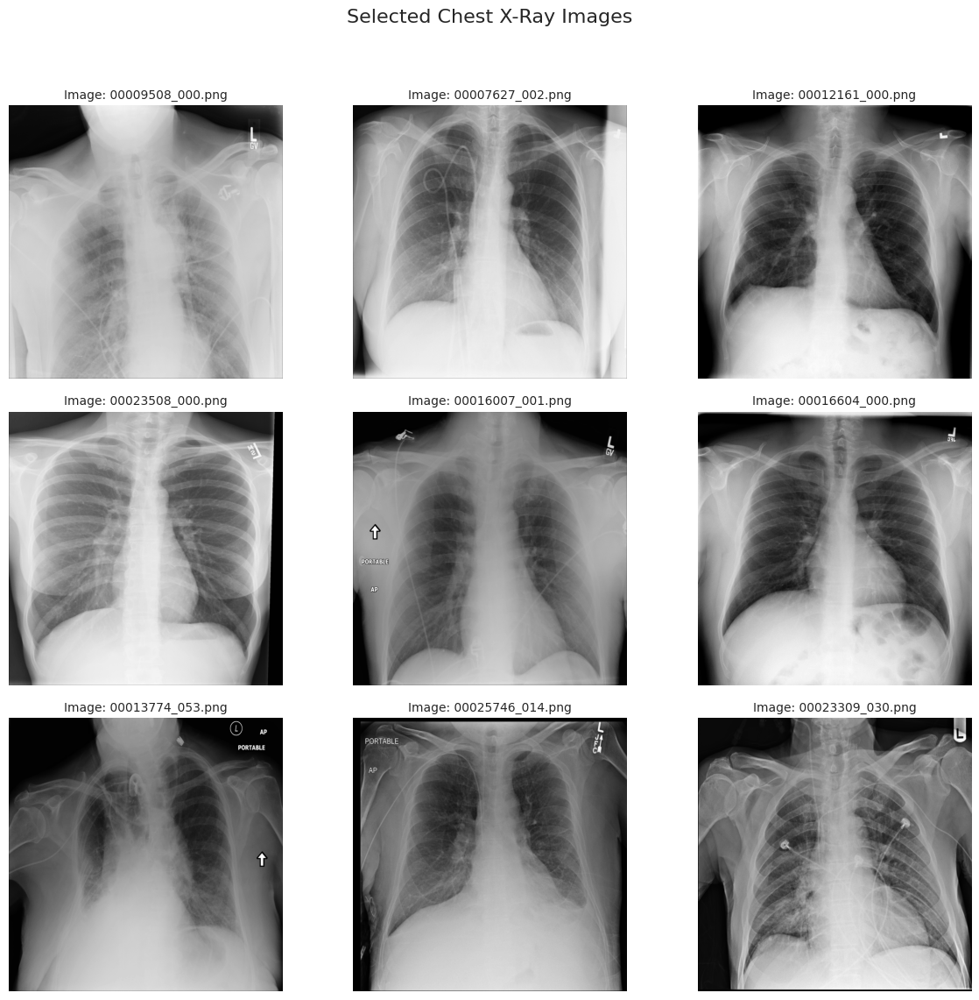

In [ ]:
# Görsellerin bulunduğu dizin ve dosya yolu
selected_images_file = '/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/selected_randomimages.txt'
img_dir = '/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/images_small/'

# Dosyadaki görüntü isimlerini okuma
with open(selected_images_file, 'r') as file:
    image_names = file.read().splitlines()

# 3x3 grid oluşturmak için bir döngü
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
fig.suptitle('Selected Chest X-Ray Images', fontsize=16)

for idx, image_name in enumerate(image_names[:9]):  # Sadece ilk 9 görüntüyü alıyoruz
    ax = axes[idx // 3, idx % 3]  # 3x3 gridde sırayla ilerliyoruz

    # Resmi yükle
    raw_image = plt.imread(os.path.join(img_dir, image_name))

    # Görselleştirme
    ax.imshow(raw_image, cmap='gray')
    ax.set_title(f"Image: {image_name}", fontsize=10)
    ax.axis('off')

    # Resim bilgilerini konsola yazdır
    print(f"\nImage: {image_name}")
    print(f"Dimensions: {raw_image.shape[0]}x{raw_image.shape[1]} pixels")
    print(f"Max pixel value: {raw_image.max():.4f}")
    print(f"Min pixel value: {raw_image.min():.4f}")
    print(f"Mean pixel value: {raw_image.mean():.4f}")
    print(f"Standard deviation: {raw_image.std():.4f}")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Üst başlık için alan bırak
plt.show()

**Sabitlenmiş verilerde Histogram**

---
**Yorum**


---

Görüntü Çeşitliliği; Görsellerdeki yoğunluk dağılımı farklılık göstermektedir. Bu durum, röntgen görüntülerindeki aydınlatma, kontrast ve dokusal detayların çeşitliliğini yansıtır. Bazı görüntülerde, örneğin sol üst ve orta üst görüntülerdeki yoğunluk dağılımı geniş bir aralığa yayılmıştır. Bu görüntülerin iyi bir kontrast ve parlaklık dengesi sunduğunu göstermektedir.
Diğer görüntülerde örnek olarak sağ üst görüntü, yoğunluk belirli bir aralıkta yoğunlaşmış, bu da düşük kontrast veya tekdüze bir görüntüleme koşuluna işaret edebilir.

Piksel Dağılım Özellikleri; Sol alt histogramlarda, düşük yoğunluklarda siyah tonlarında yoğunlaşma görülmektedir. Bu görüntülerin büyük bir kısmının koyu tonlara sahip olduğunu gösterebilir. Orta üst ve orta alt görüntülerindeki gibi bazı histogramlarda, hem düşük hem de yüksek yoğunluklarda değerler gözlemlenmektedir. Bu yüksek kontrastlı bölgelerin varlığına işaret eder. Sağ alt histogramlarda piksel yoğunluklarının büyük kısmı orta yoğunluk yani dengeli değerlerine yığılmıştır. Bu durum, görüntünün genel olarak gri tonlara sahip olduğunu gösterebilir.

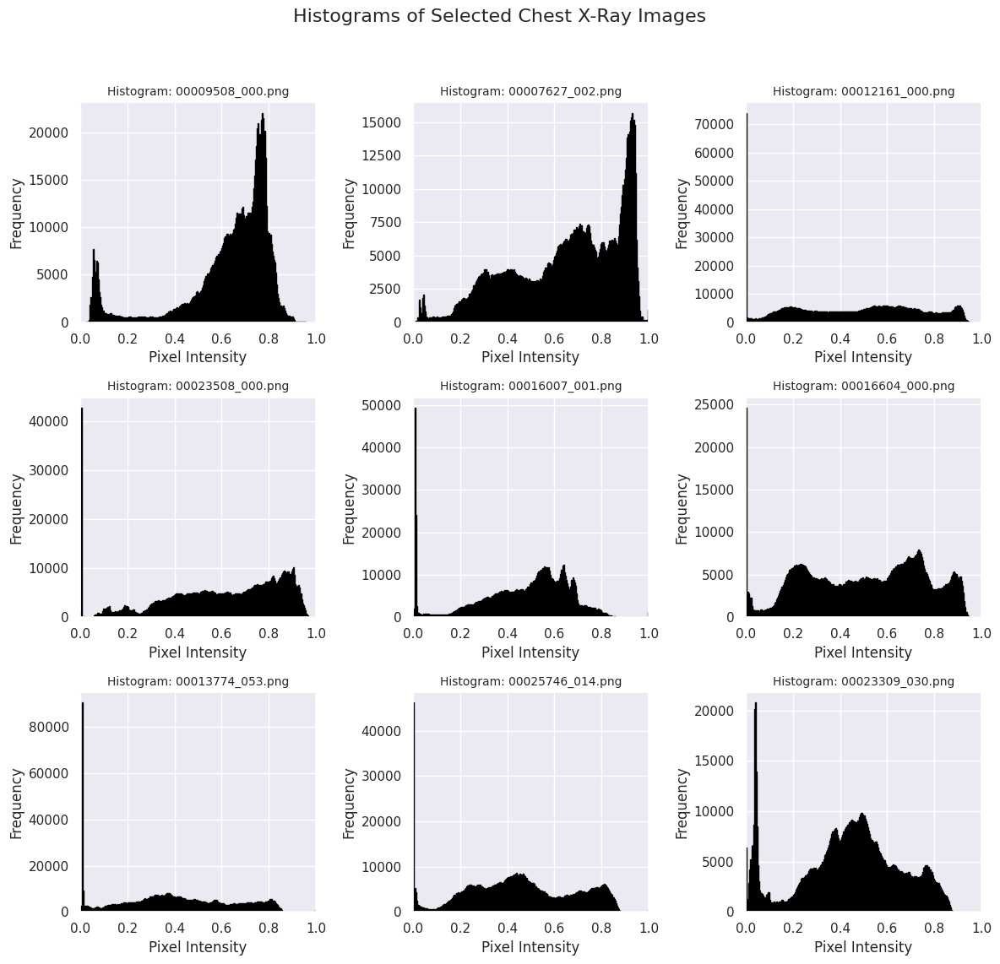

In [ ]:
# Görsellerin bulunduğu dizin

selected_images_file = '/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/selected_randomimages.txt'
img_dir = '/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/images_small/'

# 3x3 grid oluşturmak için bir döngü (her bir görüntü için histogram)
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
fig.suptitle('Histograms of Selected Chest X-Ray Images', fontsize=16)

for idx, image_name in enumerate(image_names[:9]):
    ax = axes[idx // 3, idx % 3]  # 3x3 gridde sırayla ilerliyoruz

    # Resmi yükle
    raw_image = plt.imread(os.path.join(img_dir, image_name))

    # Histogramı çiz
    ax.hist(raw_image.ravel(), bins=256, range=(0.0, 1.0), fc='black', ec='black')
    ax.set_title(f"Histogram: {image_name}", fontsize=10)
    ax.set_xlim(0, 1)  # Piksel değerleri 0 ile 1 arasında olduğu varsayılıyor

    # Eksenleri kapatmak için
    ax.set_xlabel("Pixel Intensity")
    ax.set_ylabel("Frequency")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Üst başlık için alan bırak
plt.show()


**Görüntü İşleme ve İyileştirme**

---
Görüntülerde CONTRAST STRECTCHING uygulanmıştır. CONTRAST STRECTCHING Görüntülerine GAMMA TRANSFORMATIONU uygulanmıştır.

---

**Yorum**


---

Kontrast Germe (Stretching): görüntüdeki piksel değerlerini mevcut dinamik aralıktan (örneğin, [min, max]) geniş bir aralığa (örneğin, [0, 255]) yeniden ölçeklendirmek için gerçekleştirilmiştir. Bu yöntem, düşük kontrastlı görüntülerin görünürlüğünü artırır ve görüntüdeki karanlık ya da parlak bölgelerin daha belirgin hale gelmesini sağlar. Görüntü histogramında, piksel yoğunluklarının geniş bir aralığa yayıldığı gözlemlenmiştir. Bu, görüntünün genel kontrastını artırmış ve görsel olarak daha tatmin edici hale getirmiştir. Kontrast germe işlemi sonucunda, özellikle karanlık bölgelerdeki detayların daha iyi ayırt edilebildiği fark edilmiştir.

Histogram Eşitleme (Equalization): kontrastı artırmak ve parlaklık değerlerinin daha dengeli bir şekilde dağılmasını sağlamak amacıyla uygulanmıştır. Görüntünün piksel değerleri, bu yöntem sayesinde daha düzgün bir dağılım elde edecek şekilde yeniden düzenlenmiştir. Özellikle düşük kontrastlı bölgelerdeki detayların daha belirgin hale geldiği görülmektedir. Histogram eşitleme sonucunda, görüntü histogramında piksel yoğunluklarının eşit bir dağılım sergilediği fark edilmiştir. Bu işlem, görüntünün her bir bölgesinde detayların görünürlüğünü artırmış ve genelde daha net bir görüntü ortaya çıkarmıştır.

Gamma Düzeltme (Gamma Correction): görüntüdeki parlaklık seviyelerini doğrusal olmayan bir şekilde ayarlamak için kullanılmıştır. Bu işlem sırasında gamma değeri
𝛾
=
1.2
γ=1.2 olarak belirlenmiş ve piksel değerleri bu parametreye göre yeniden hesaplanmıştır. Gamma değeri 1'den büyük olduğu için, görüntüdeki parlaklık azaltılmış ve bu durum özellikle aşırı parlak bölgelerde detayların daha net bir şekilde görünmesini sağlamıştır. Bu işlem, görüntünün genel kontrastını iyileştirirken, belirli parlaklık bölgelerinin öne çıkmasını da sağlamıştır. Görüntü histogramında, gamma düzeltmesine bağlı olarak piksel yoğunluklarının parlaklık ekseninde kaydığı gözlemlenmiştir.

Sonuç: Yukarıdaki üç işlem ardışık olarak uygulanarak görüntünün genel kalitesinde önemli iyileştirmeler sağlanmıştır. Kontrast germe, görüntünün dinamik aralığını artırarak temel kontrast sorunlarını çözerken; histogram eşitleme, parlaklık dağılımını dengeleyerek görüntünün daha net ve detaylı görünmesini sağlamıştır. Son olarak, gamma düzeltme, belirli parlaklık bölgelerini öne çıkararak görsel algıyı optimize etmiştir. Bu işlemler bir araya geldiğinde, görüntünün analitik ya da tanısal amaçlar için daha uygun bir hale getirildiği söylenebilir.

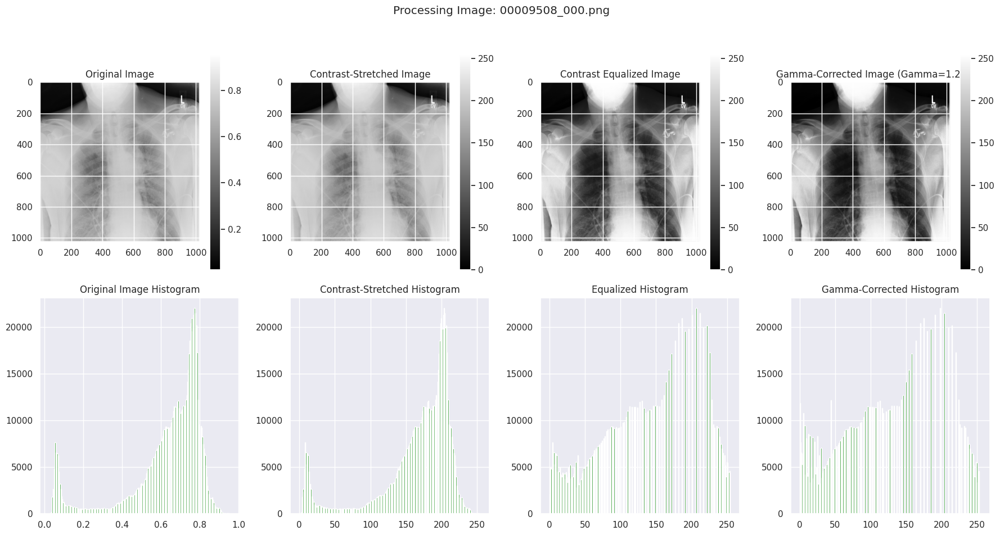

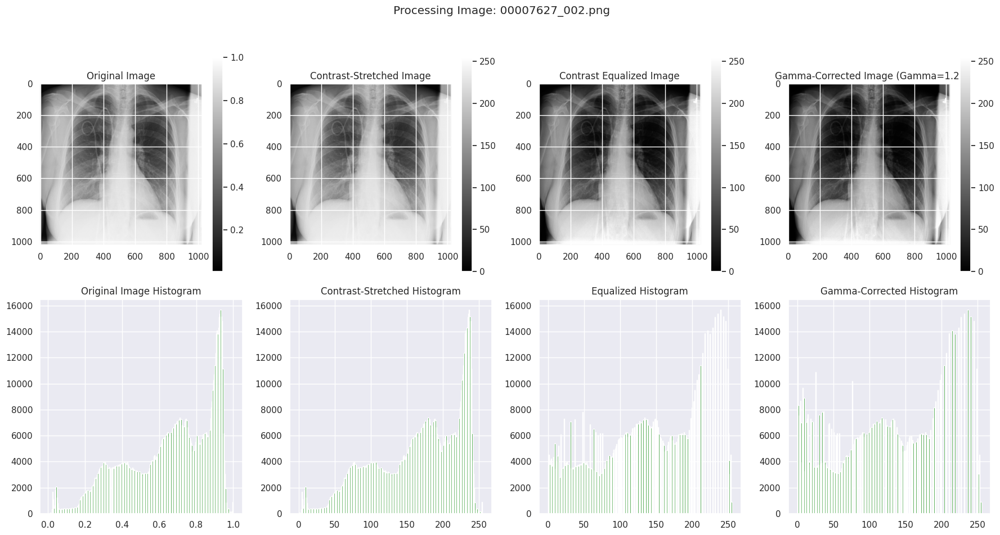

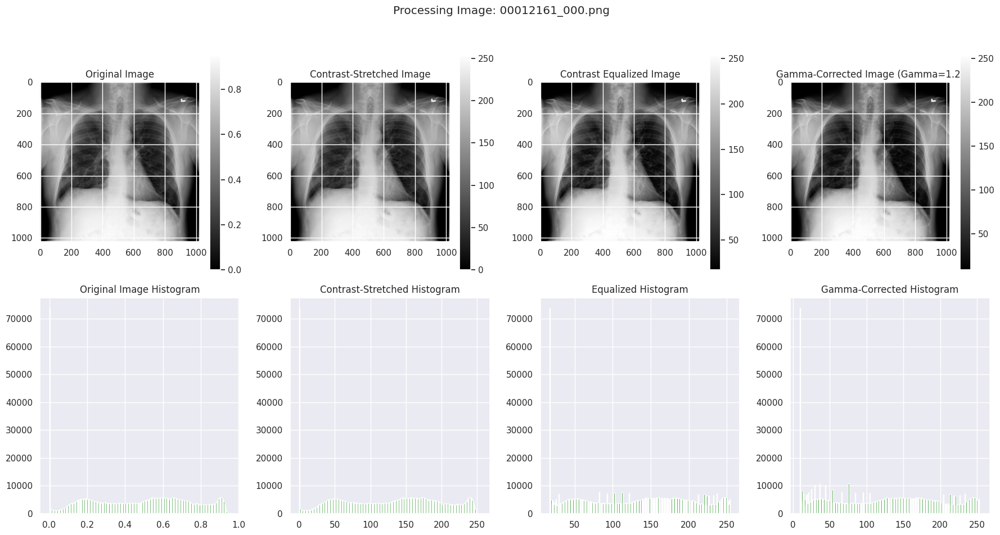

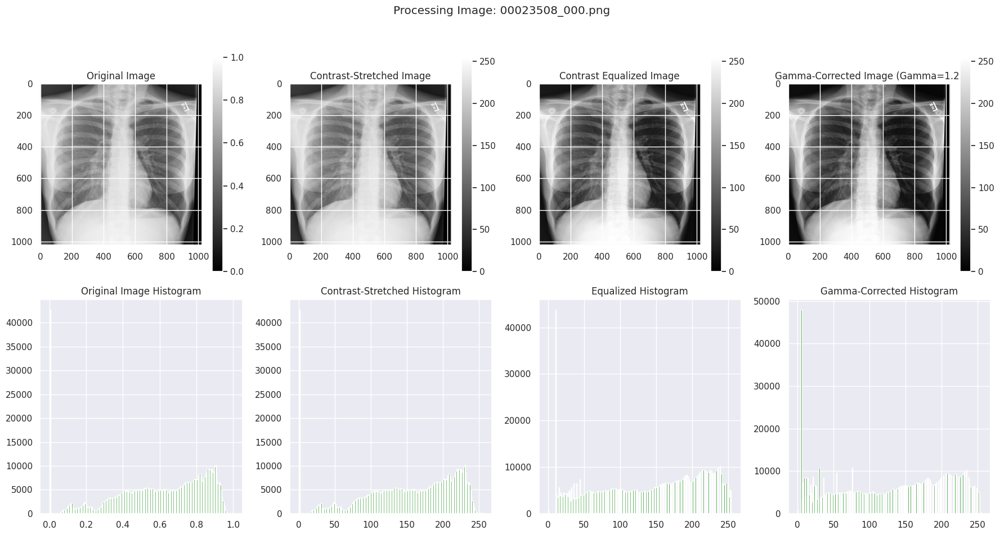

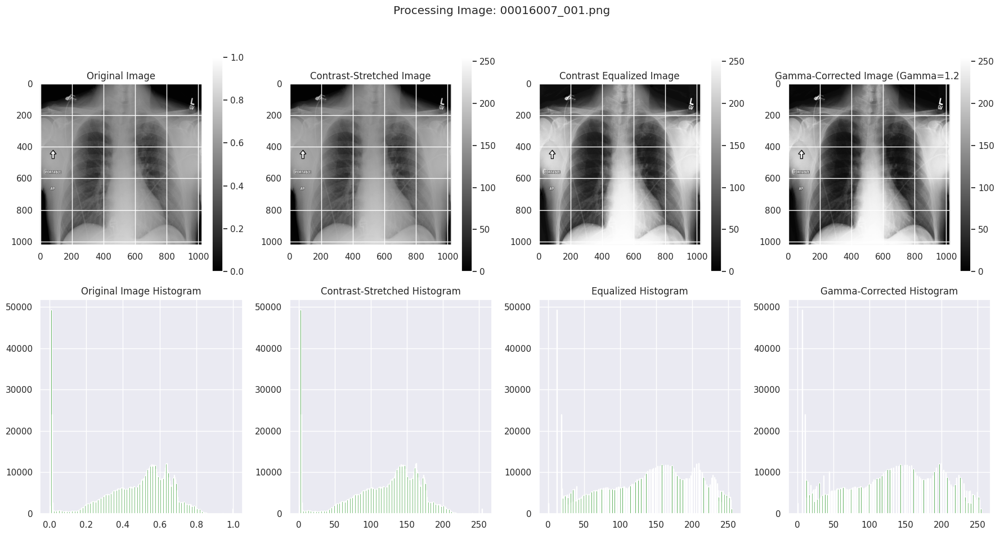

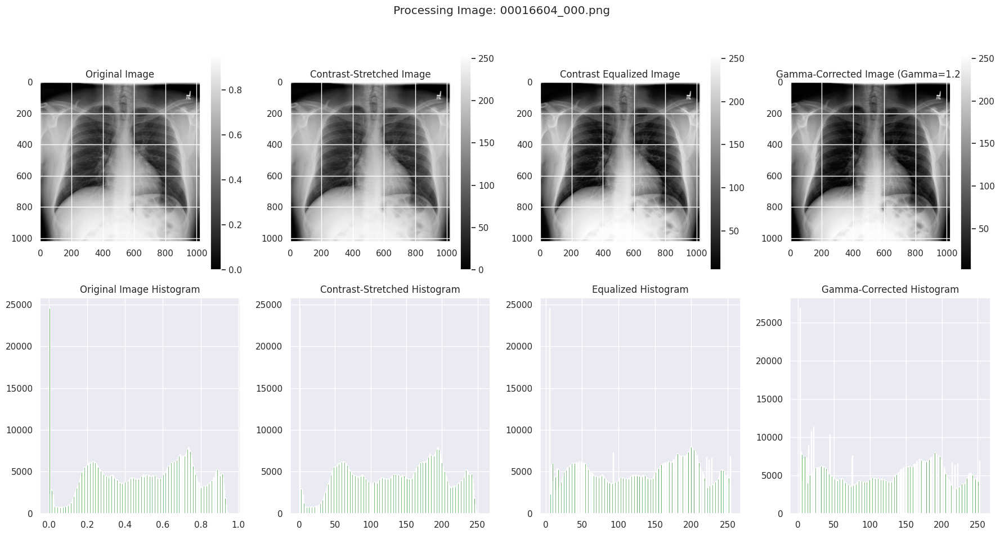

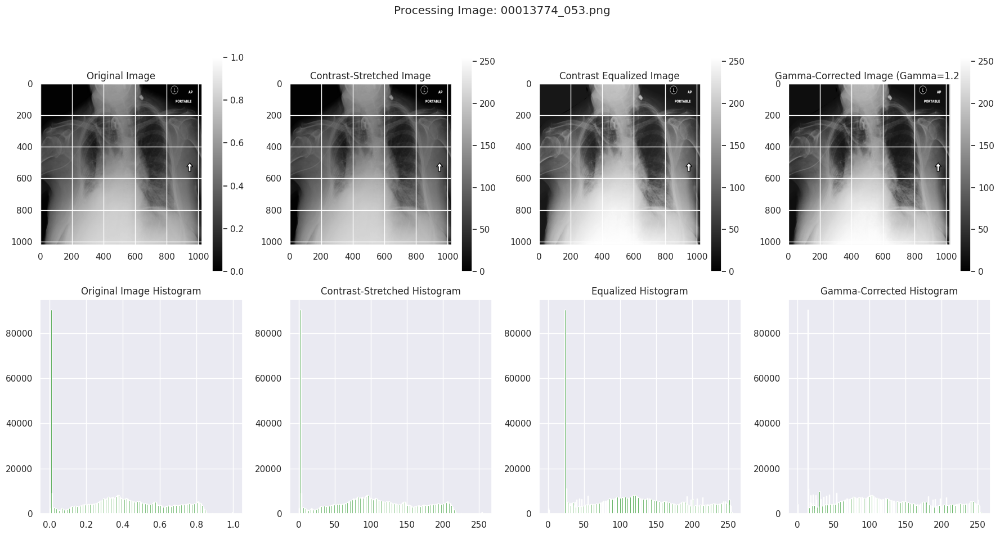

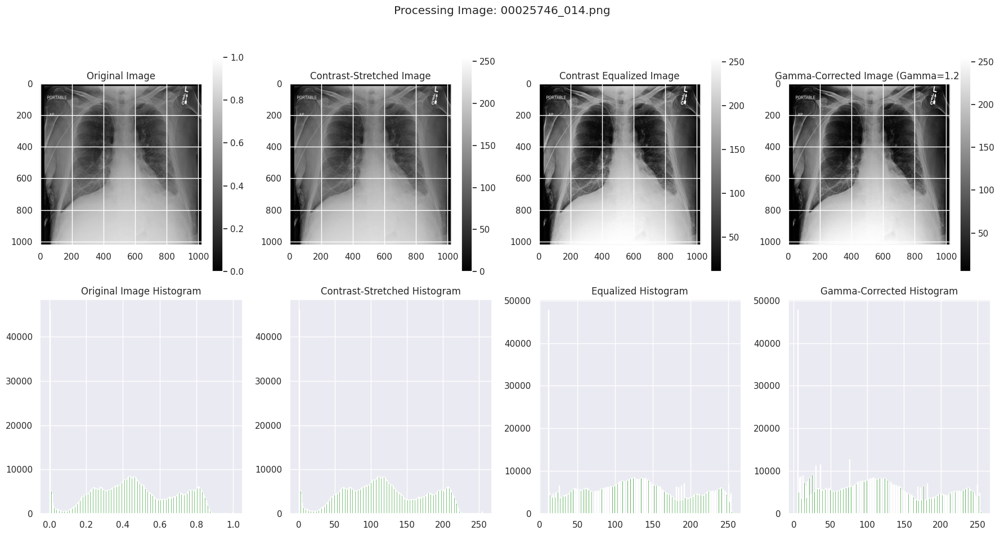

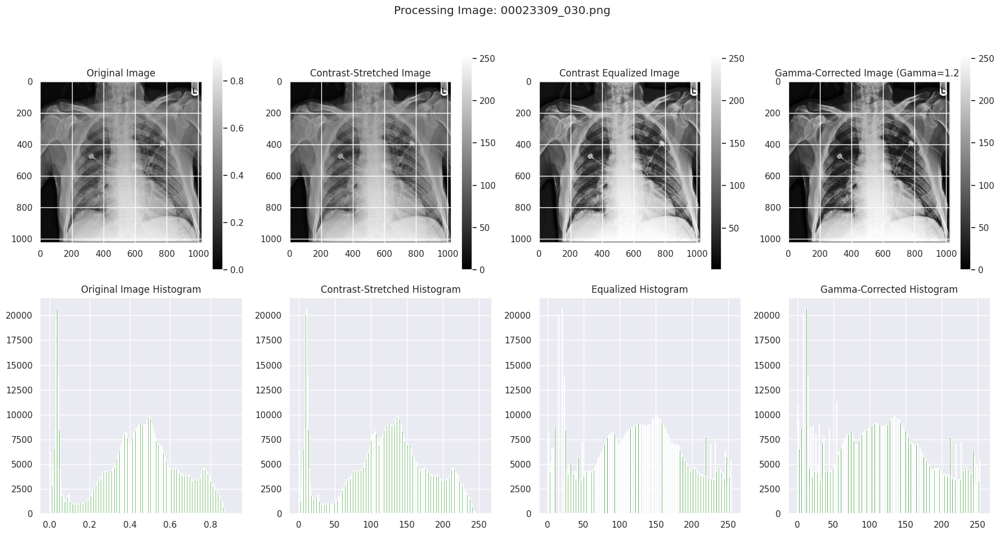

In [ ]:
# Görsellerin bulunduğu dizin ve dosya yolu
selected_images_file = '/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/selected_randomimages.txt'
img_dir = '/content/drive/MyDrive/SayisalGoruntuIslemeVize/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/nih/images_small/'

gammaimagecontention = []

# Dosyadaki görüntü isimlerini okuma
with open(selected_images_file, 'r') as file:
    image_names = file.read().splitlines()

# Her görüntü için işlemleri tekrarla
for image_name in image_names[:9]:  # Sadece ilk 9 görüntüyü alıyoruz
    raw_image = plt.imread(os.path.join(img_dir, image_name))

    # Kontrast germe
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)

    # Histogram eşitleme
    equalized_image = exposure.equalize_hist(contrast_stretched)
    equalized_image = (equalized_image * 255).astype(np.uint8)

    # Gama düzeltmesi
    gamma = 1.2  # Gama değeri
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)
    gammaimagecontention.append(gamma_corrected)


    # Görselleştirme
    plt.figure(figsize=(18, 10))

    # Orijinal görüntü ve histogramı
    plt.subplot(2, 4, 1)
    plt.imshow(raw_image, cmap='gray')
    plt.title('Original Image')
    plt.colorbar()
    plt.subplot(2, 4, 5)
    plt.hist(raw_image.ravel(), bins=256, color='green')
    plt.title("Original Image Histogram")

    # Kontrast gerilmiş görüntü ve histogramı
    plt.subplot(2, 4, 2)
    plt.imshow(contrast_stretched, cmap='gray')
    plt.title('Contrast-Stretched Image')
    plt.colorbar()
    plt.subplot(2, 4, 6)
    plt.hist(contrast_stretched.ravel(), bins=256, color='green')
    plt.title("Contrast-Stretched Histogram")

    # Histogram eşitlenmiş görüntü ve histogramı
    plt.subplot(2, 4, 3)
    plt.imshow(equalized_image, cmap='gray')
    plt.title('Contrast Equalized Image')
    plt.colorbar()
    plt.subplot(2, 4, 7)
    plt.hist(equalized_image.ravel(), bins=256, color='green')
    plt.title("Equalized Histogram")

    # Gama düzeltmeli görüntü ve histogramı
    plt.subplot(2, 4, 4)
    plt.imshow(gamma_corrected, cmap='gray')
    plt.title(f'Gamma-Corrected Image (Gamma={gamma})')
    plt.colorbar()
    plt.subplot(2, 4, 8)
    plt.hist(gamma_corrected.ravel(), bins=256, color='green')
    plt.title("Gamma-Corrected Histogram")

    plt.suptitle(f'Processing Image: {image_name}')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

**Gamma uygulanmış resimlerin histogram çizimi**

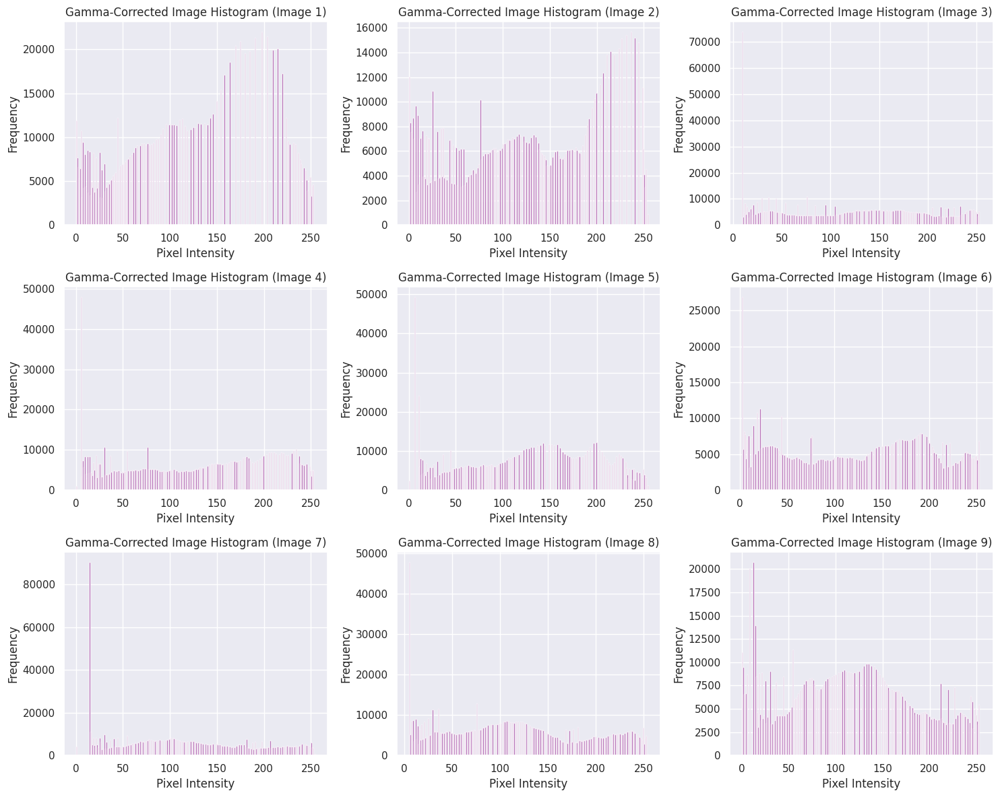

In [ ]:
# 3x3 düzeninde histogramları çizme
num_images = len(gammaimagecontention)
fig, axes = plt.subplots(3, 3, figsize=(15, 12))

for i, gamma_corrected_image in enumerate(gammaimagecontention[:9]):  # İlk 9 görüntü için
    row, col = divmod(i, 3)
    axes[row, col].hist(gamma_corrected_image.ravel(), bins=256, color='purple', alpha=0.75)
    axes[row, col].set_title(f'Gamma-Corrected Image Histogram (Image {i+1})')
    axes[row, col].set_xlabel('Pixel Intensity')
    axes[row, col].set_ylabel('Frequency')

# Boş kalan eksenleri gizleme (Eğer 9’dan az görüntü varsa)
for j in range(i+1, 9):
    row, col = divmod(j, 3)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


**Gürültü Azaltma İşlemi**

---

Median ve Gaussian Blur Uygulama

---

**Yorum**

---

Bu çalışmada X-ray görüntülerine farklı görüntü işleme teknikleri uygulanmıştır ilk olarak, gamma düzeltmesi kullanılarak görüntünün parlaklık ve kontrast seviyeleri optimize edilmiştir. Gamma düzeltmesi, özellikle karanlık alanların daha görünür hale gelmesini sağlarken, aşırı parlak alanlarda detay kaybını önlemiştir. Bu işlem, görüntünün analiz için daha uygun bir hale getirilmesini sağlamış, detayların belirginleşmesine katkıda bulunmuştur.

Daha sonra, görüntüye median blur uygulanmıştır. Bu yöntem, özellikle gürültüyü azaltmada etkili bir tekniktir. Median blur, her pikselin yeni değerini komşularının medyanına göre hesaplayarak çalışır ve bu sayede görüntüdeki rastgele gürültüleri temizlerken kenar detaylarını korur. X-ray görüntüsünde bu uygulamanın ardından, kemik yapıları ve diğer ince anatomik detaylar net bir şekilde korunmuş, aynı zamanda görüntüdeki küçük parazitler azaltılmıştır.

Son olarak, Gaussian blur yöntemi uygulanmıştır. Bu teknik, görüntüyü yumuşatarak genel olarak daha pürüzsüz bir görünüm elde edilmesini sağlar. Piksel değerleri, komşularının ağırlıklı ortalamasına göre hesaplandığından, görüntüde büyük desenler ve düşük frekanslı yapıların daha belirgin hale gelmesine yardımcı olur. Ancak Gaussian blur, median blur kadar keskin kenar detaylarını koruyamaz ve bu nedenle bazı ince detayların kaybolmasına neden olabilir. Buna rağmen, geniş yüzeylerdeki desenlerin analizinde avantaj sağlar.

Bu adımların sonucunda, her bir görüntü işleme tekniğinin farklı bir etkisi olduğu görülmektedir. Gamma düzeltmesi, görüntünün genel kontrastını artırarak diğer işlemler için uygun bir temel hazırlamış, median blur detayları koruyarak gürültüyü azaltmış, Gaussian blur ise geniş desenleri vurgulamış ancak detayları yumuşatmıştır. Bu kombinasyon, özellikle tıbbi görüntülemede hem gürültünün azaltılması hem de kritik detayların vurgulanması açısından etkili bir yöntem seti sunmaktadır.

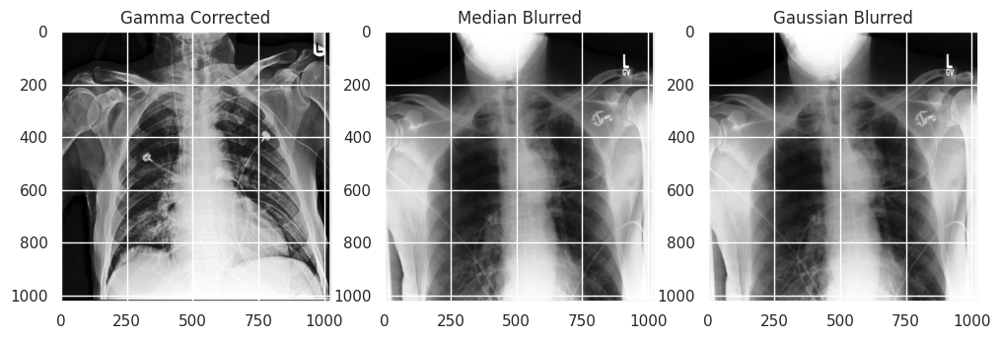

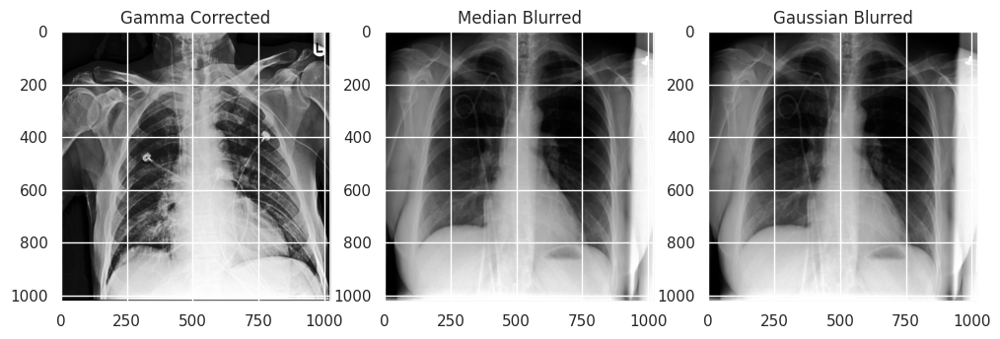

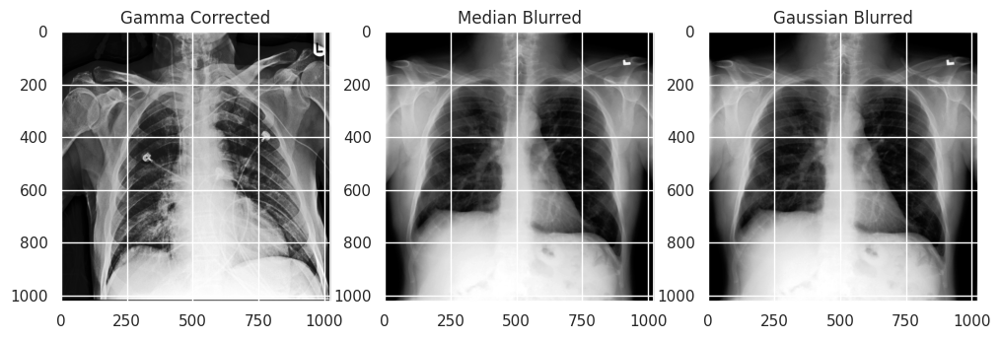

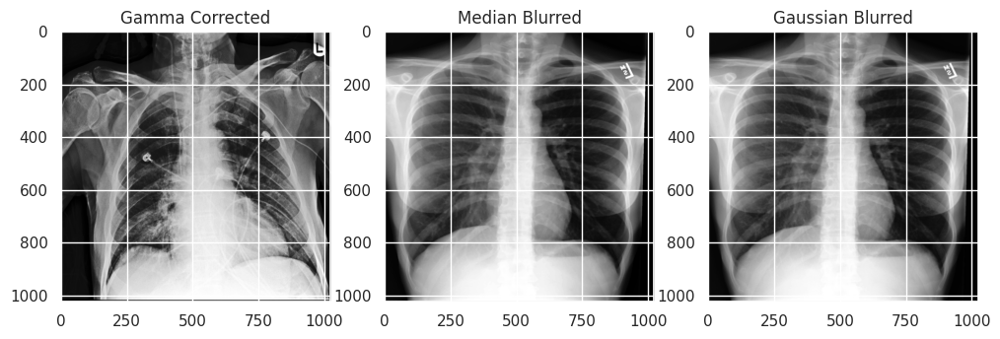

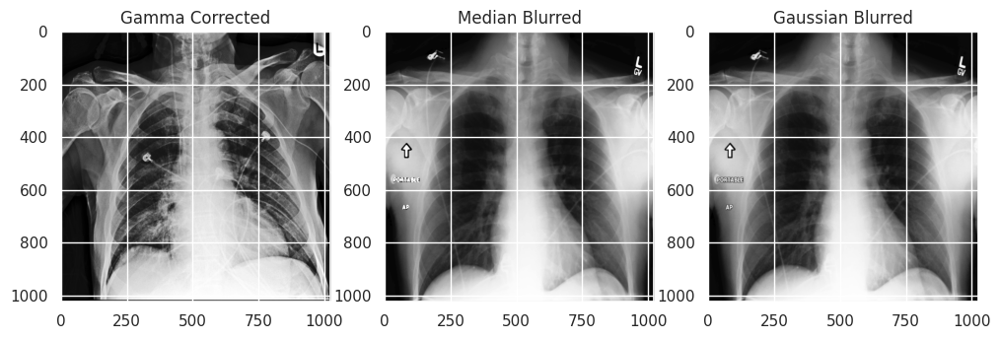

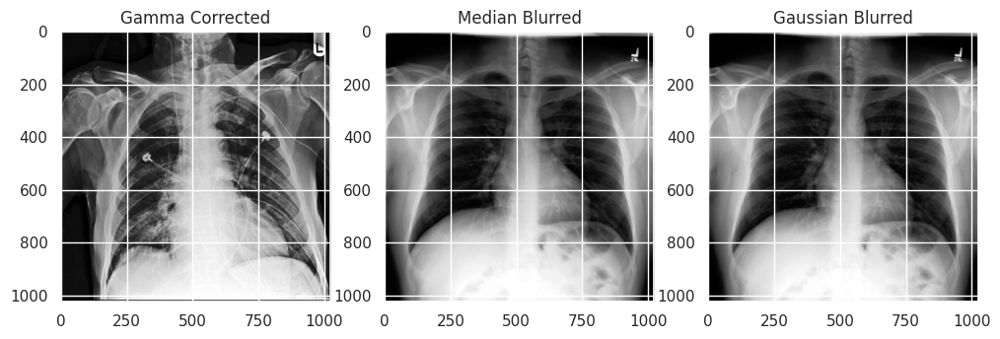

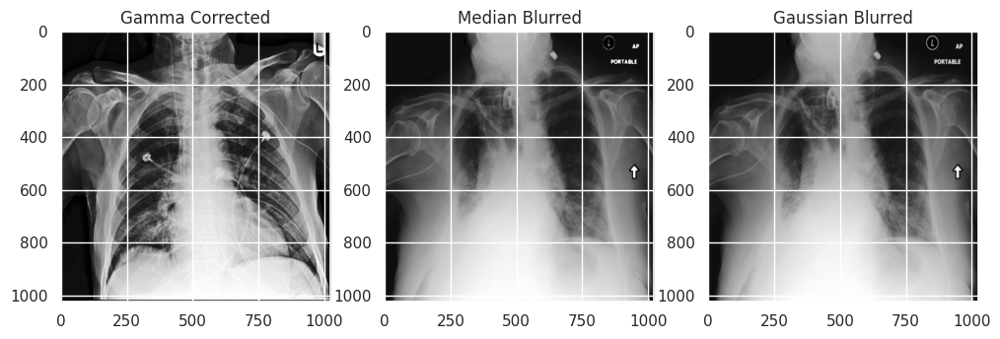

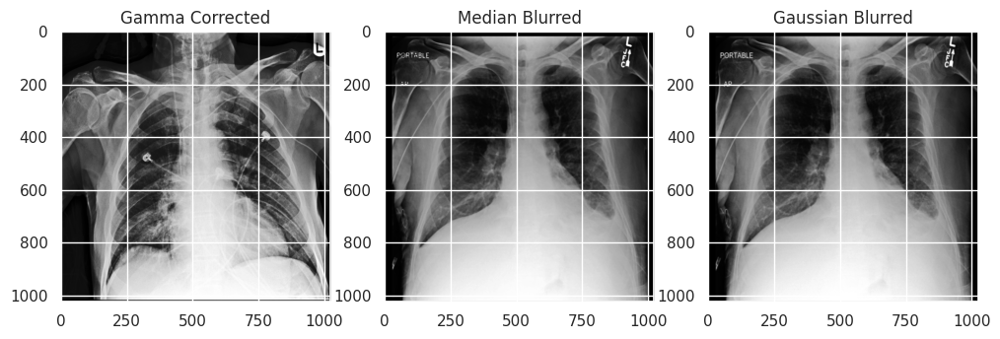

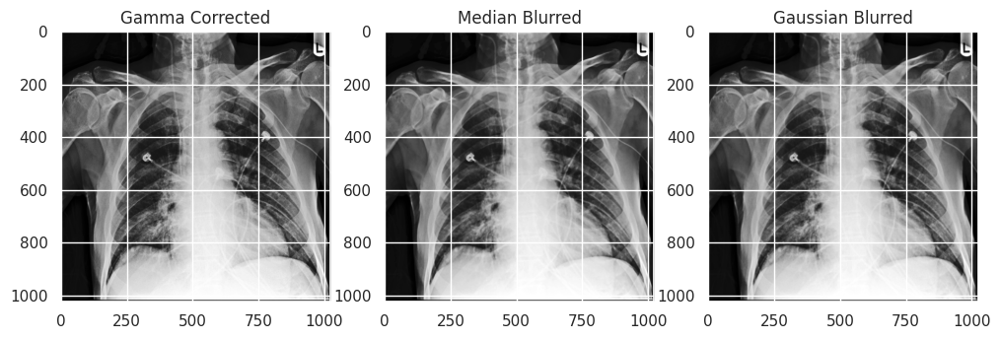

In [ ]:
medianfilter = []

# Her görüntü için işlemleri tekrarla
for idx, gamma_corrected_image in enumerate(gammaimagecontention):

# Median Blur uygulanmış görüntü
  median_blurred = cv2.medianBlur(gamma_corrected_image, 5)
  medianfilter.append(median_blurred)

# Gaussian Blur uygulanmış görüntü
  gaussian_blurred = cv2.GaussianBlur(gamma_corrected_image, (5, 5), 0)

# Sonuçları görselleştirme
  plt.figure(figsize=(12, 6))

  plt.subplot(1, 3, 1)
  plt.title('Gamma Corrected')
  plt.imshow(gamma_corrected, cmap='gray')

  plt.subplot(1, 3, 2)
  plt.title('Median Blurred')
  plt.imshow(median_blurred, cmap='gray')

  plt.subplot(1, 3, 3)
  plt.title('Gaussian Blurred')
  plt.imshow(gaussian_blurred, cmap='gray')
  plt.show()

**Resimleri Döndürme ve Çevirme İşlemi**

---

**Yorum**

---

Bu çalışmada, X-ray görüntüleri üzerinde veri artırma (data augmentation) teknikleri uygulanmıştır. İlk olarak, görüntülerin orijinal halleri üzerinde herhangi bir işlem yapılmadan görselleştirilmiştir. Veri artırma işlemleri kapsamında iki farklı yöntem kullanılmıştır: döndürme ve yatay çevirme (flipping).

Döndürme İşlemi:
Görüntüler, rastgele 0 ile 10 derece arasında belirlenen açılarla döndürülmüştür. Bu işlem, cv2.getRotationMatrix2D fonksiyonu ile bir dönüşüm matrisi oluşturularak gerçekleştirilmiştir. Ardından cv2.warpAffine fonksiyonu ile döndürme işlemi uygulanmıştır. Döndürme işlemi sonucunda, görüntülerin kenarlarında siyah alanlar (boşluklar) oluştuğu görülmektedir. Bu alanlar, döndürme sırasında orijinal görüntü sınırlarının dışına çıkan piksellerden kaynaklanmaktadır. Döndürme işlemi, modelin farklı açılardan gelen görüntülerde de başarılı olmasını sağlamak amacıyla yapılmıştır.

Yatay Çevirme İşlemi:
Görüntüler, cv2.flip fonksiyonu kullanılarak yatay eksende ters çevrilmiştir. Bu işlem, orijinal görüntünün sağ ve sol taraflarının yer değiştirmesiyle sonuçlanmıştır. Simetrik özelliklere sahip X-ray görüntülerinde, bu tür bir işlem veri çeşitliliğini artırmak ve modelin öğrenme kapasitesini geliştirmek için etkili bir yöntemdir. Bununla birlikte, bazı spesifik durumlarda (örneğin, görüntünün sağ ya da sol tarafındaki farklılıkların önemli olduğu durumlarda) bu işlem dikkatle kullanılmalıdır.

Bu iki veri artırma tekniği, sınırlı veri setlerinde modelin genel performansını artırmak için önemlidir. Döndürme ve yatay çevirme işlemleriyle model, farklı açılardan veya simetrik pozisyonlardan gelen verileri öğrenebilir hale gelir. Bu sayede, modelin genelleme yeteneği artırılmış olur.

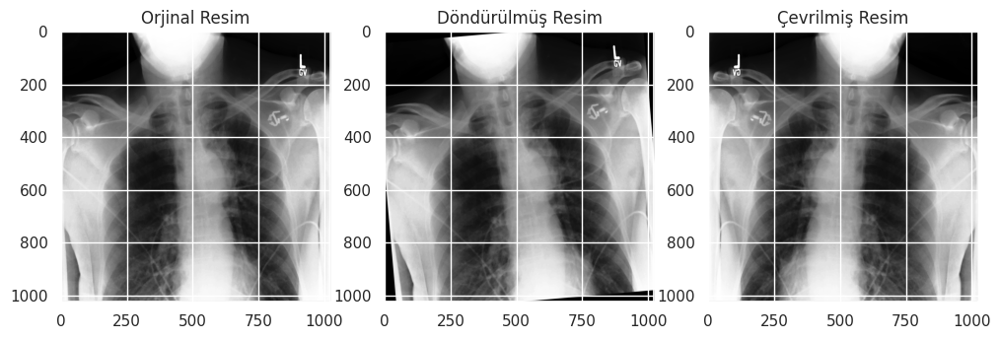

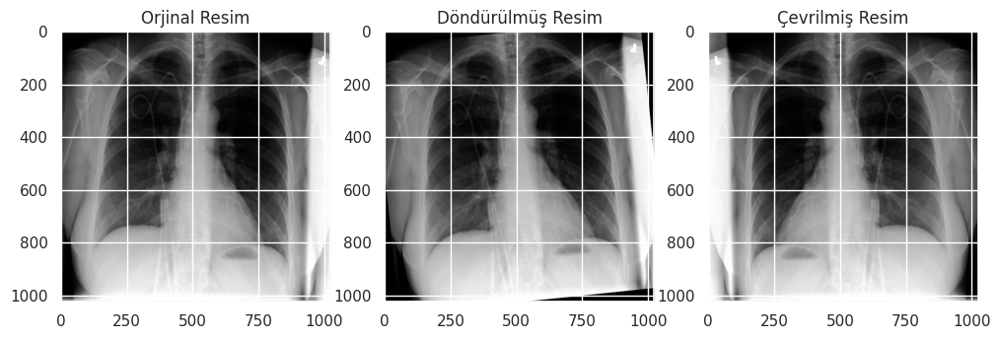

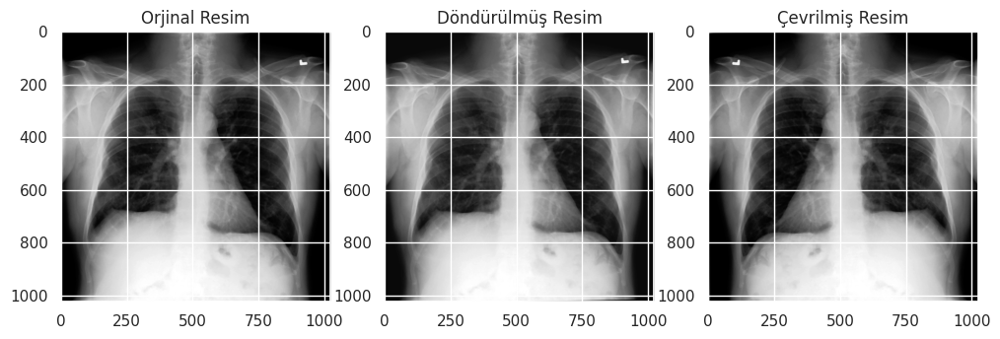

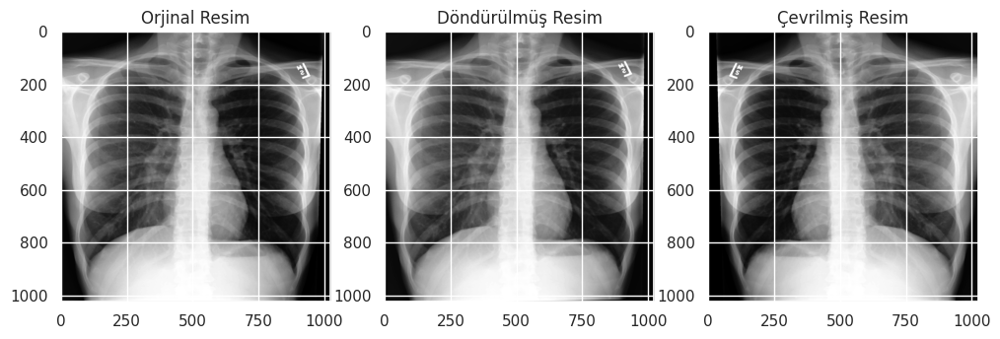

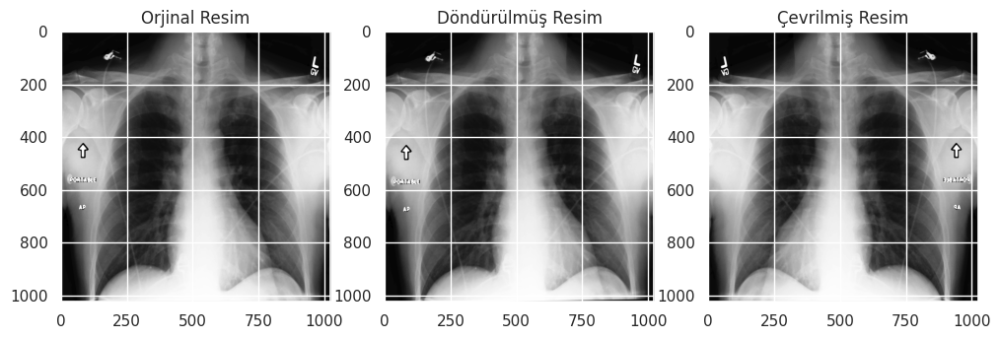

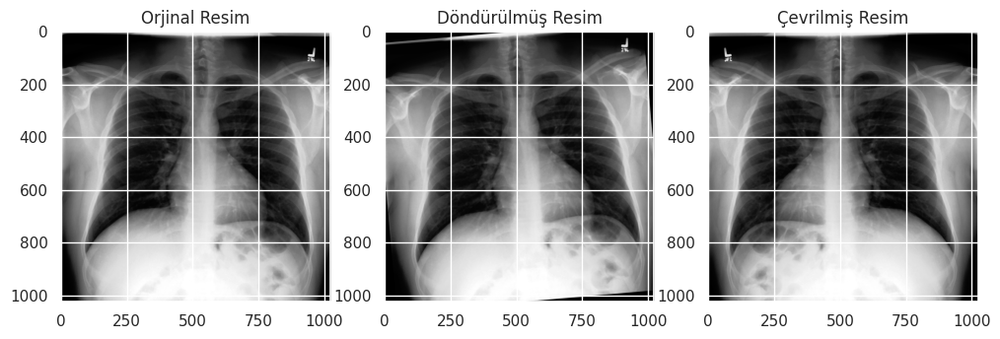

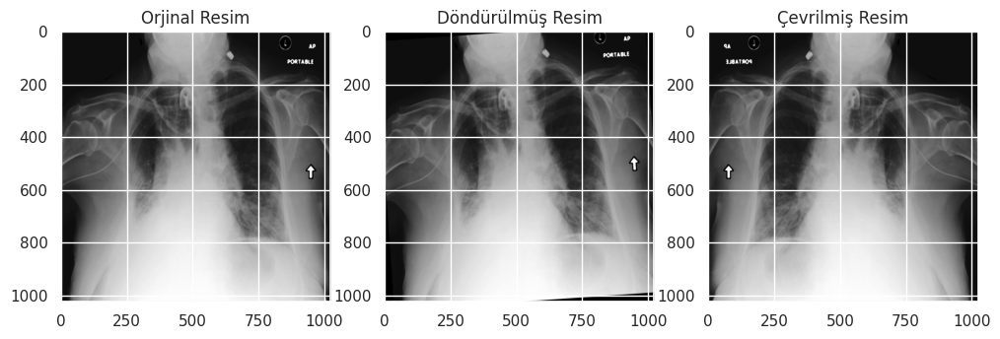

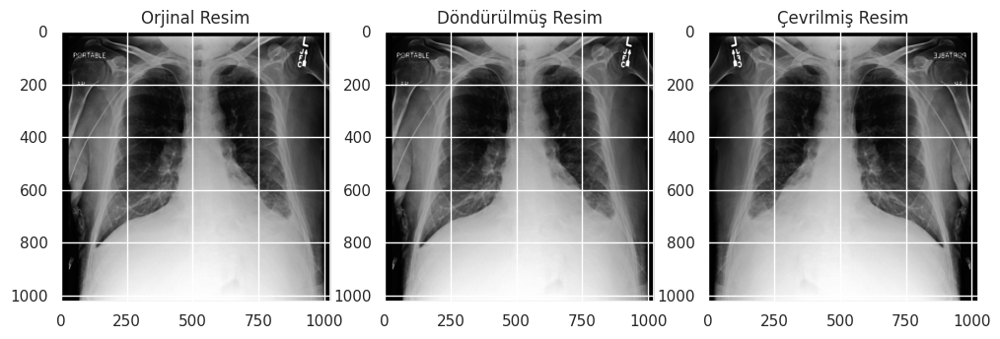

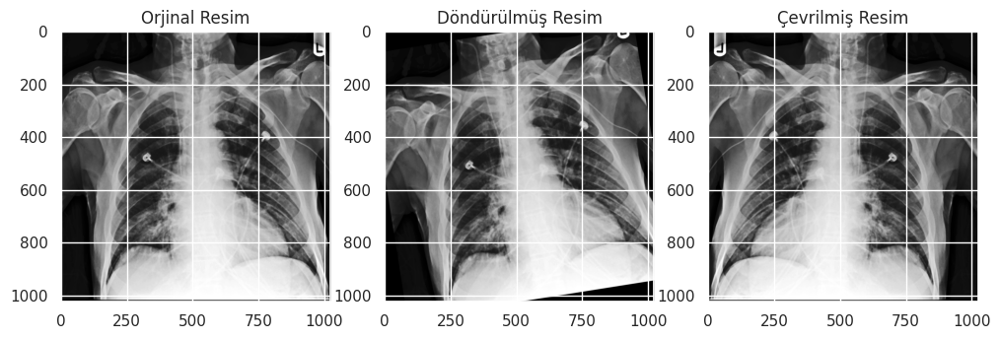

In [ ]:
# Resimleri Döndürme ve Çevirme İşlemi
rotated_images = []
flipped_images = []


for idx, image in enumerate(medianfilter):
  # Döndürme (rastgele 0 ila 10 derece arasında)
  angle = random.randint(0, 10)
  rows, cols = image.shape[:2]
  rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
  rotated_image = cv2.warpAffine(image, rotation_matrix, (cols, rows))
  rotated_images.append(rotated_image)


  # Yatay Çevirme
  flipped_image = cv2.flip(image, 1)
  flipped_images.append(flipped_image)


# Sonuçları Görselleştirme
for i in range(len(medianfilter)):
  plt.figure(figsize=(12, 6))

  plt.subplot(1, 3, 1)
  plt.imshow(medianfilter[i], cmap='gray')
  plt.title('Orjinal Resim')


  plt.subplot(1, 3, 2)
  plt.imshow(rotated_images[i], cmap='gray')
  plt.title('Döndürülmüş Resim')


  plt.subplot(1, 3, 3)
  plt.imshow(flipped_images[i], cmap='gray')
  plt.title('Çevrilmiş Resim')


  plt.show()

**Frekans Alanında Filtreleme İşlemi**

---

**Yorum**


---


Giriş görüntülerinde, tıbbi röntgen görüntüleri ham haliyle sunulmuştur. Bu görüntü, frekans analizine başlamadan önce işlem yapılacak temel görsel olarak kullanılmıştır. Görüntüdeki detaylar net olsa da, gürültü ve gereksiz bilgiler bulunabilir. Bu nedenle, görüntü işleme adımlarıyla bu sorunlar giderilmeye çalışılmıştır.

İkinci adımda, Fourier dönüşümü uygulanarak görüntü frekans alanına dönüştürülmüştür. Frekans alanında, düşük frekanslar görüntünün genel yapısını (örneğin, organların ana hatları), yüksek frekanslar ise ince detayları ve gürültüyü temsil etmektedir. Görselde, frekans alanındaki bileşenler parlaklık düzeyleriyle ifade edilmiş, merkezde düşük frekans bileşenleri yoğun olarak görülürken, çevrede yüksek frekans bileşenleri yer almıştır. Çapraz şekildeki parlak çizgiler ise görüntüdeki periyodik yapıların veya simetrik desenlerin bir göstergesidir.

Üçüncü adımda, frekans alanında düşük frekansları geçiren bir maske uygulanarak yüksek frekanslı bileşenler baskılanmış ve düşük frekanslar korunmuştur. Bu işlem, görüntüdeki gürültüyü ve gereksiz detayları azaltırken, ana yapıların daha belirgin hale gelmesini sağlamıştır. Daha sonra, ters Fourier dönüşümü ile filtrelenmiş frekans bileşenleri uzamsal alana dönüştürülerek yeni bir görüntü elde edilmiştir. Bu işlem, tıbbi analizde önemli olan yapıların daha net bir şekilde incelenmesine olanak tanımaktadır.

Son adımda, giriş görüntüsü ile filtrelenmiş görüntü karşılaştırılmıştır. Filtrelenmiş görüntüde, giriş görüntüsüne kıyasla daha az gürültü ve daha belirgin yapılar görülmektedir. Bu da filtreleme işleminin başarısını ve görüntü üzerindeki olumlu etkisini açıkça göstermektedir.

Sonuç olarak, uygulanan bu adımlar sayesinde tıbbi görüntü üzerinde detaylar daha net hale getirilmiş, gürültü azaltılmış ve analiz edilebilirlik artırılmıştır.

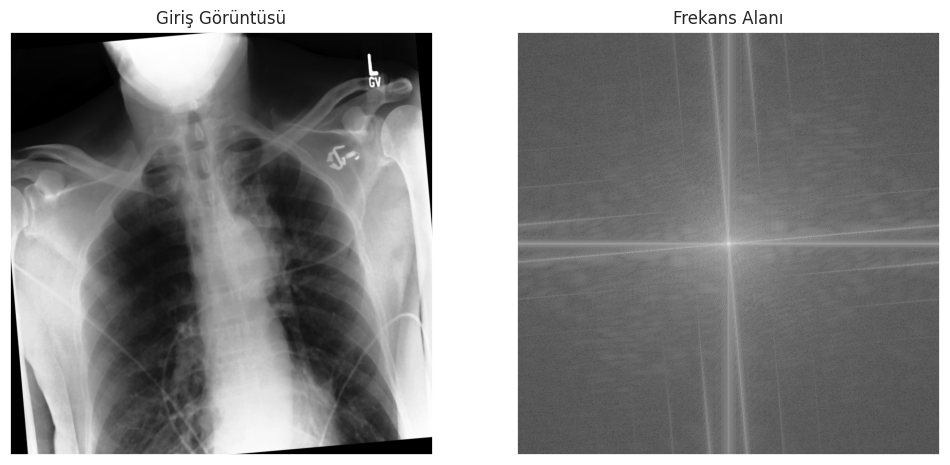

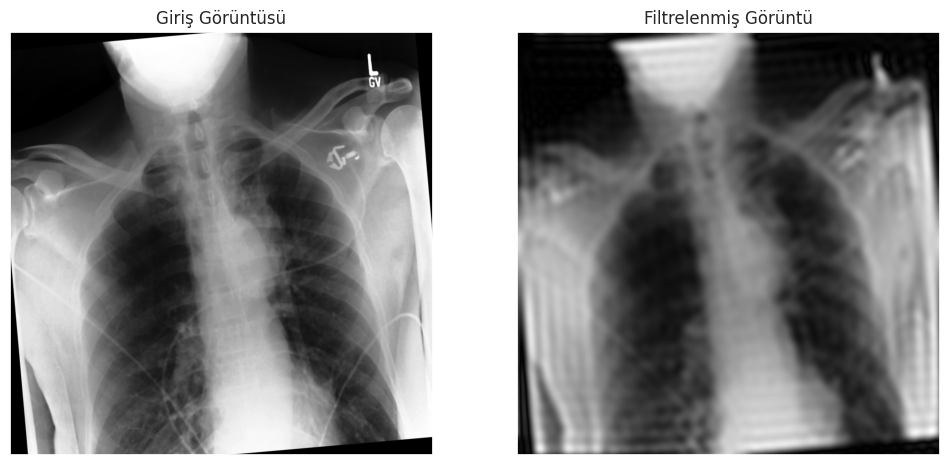

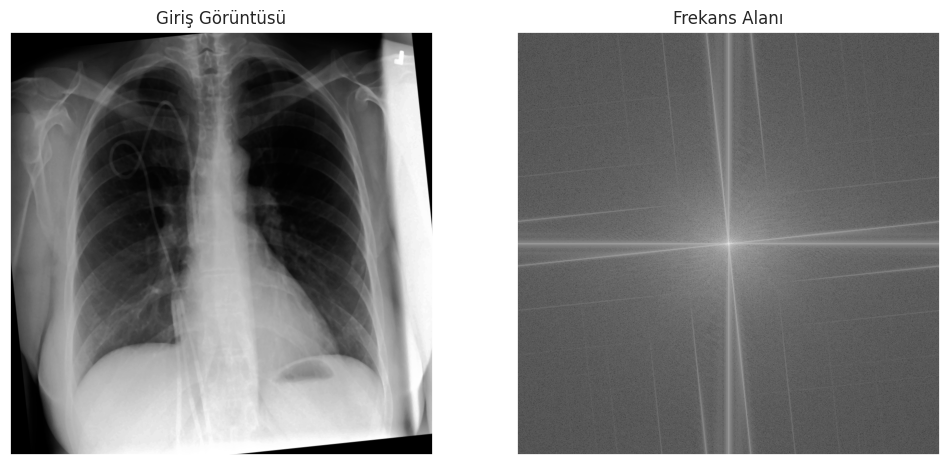

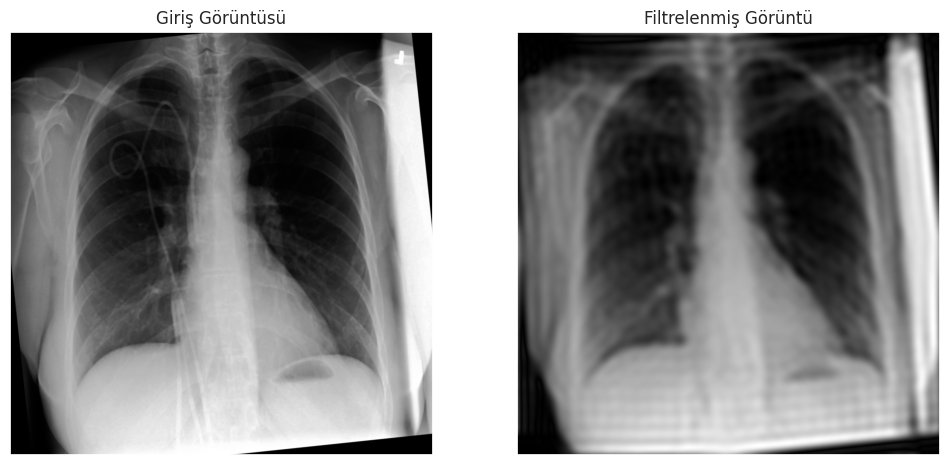

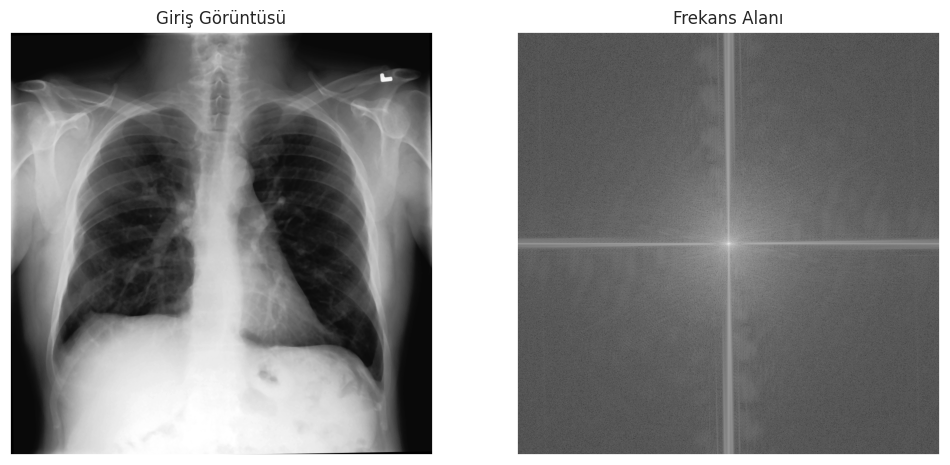

...

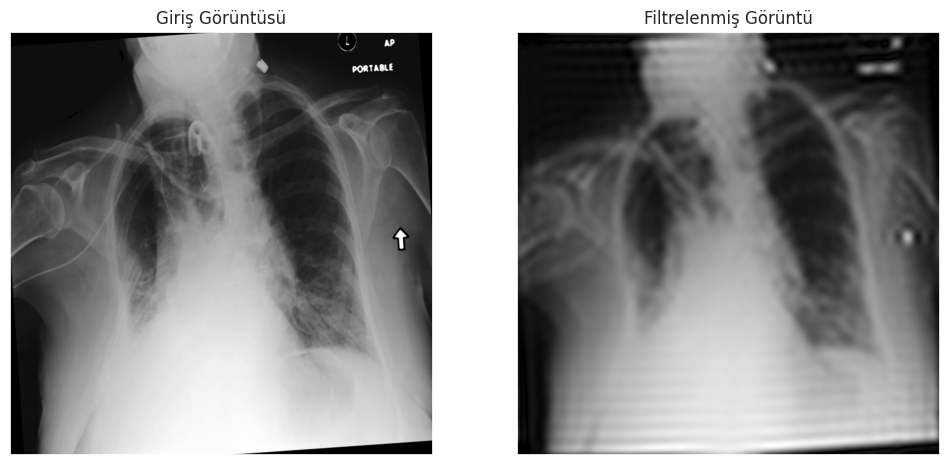

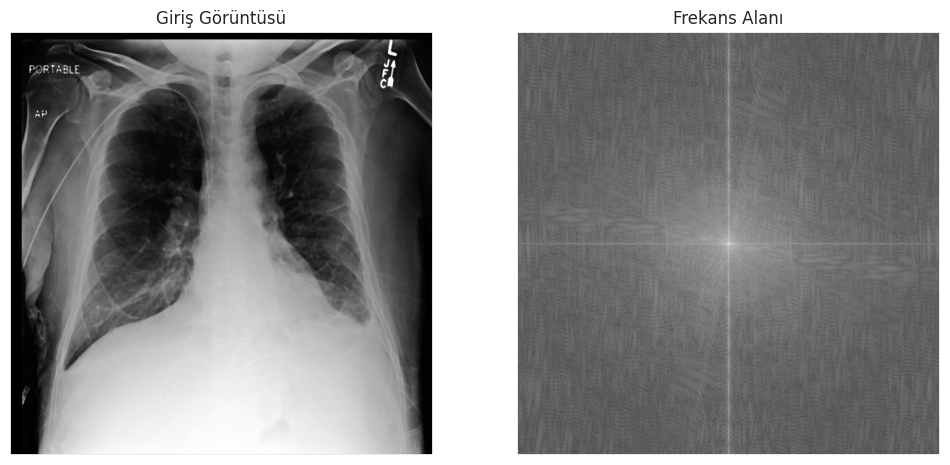

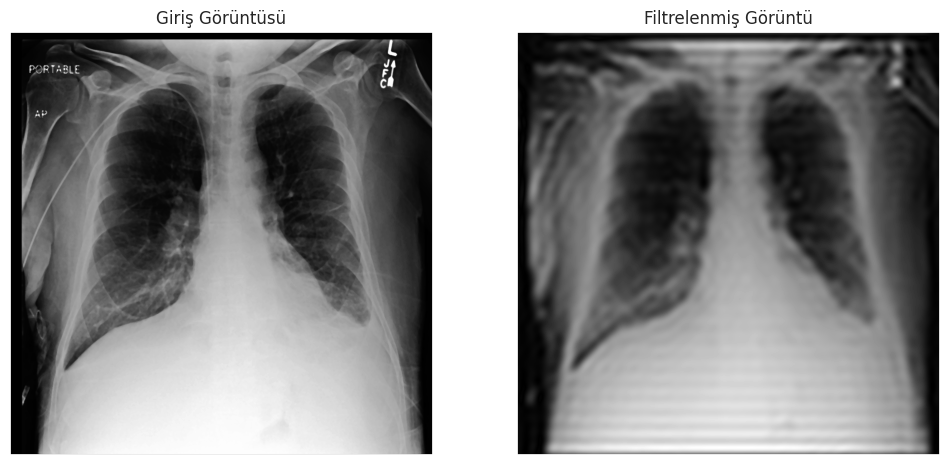

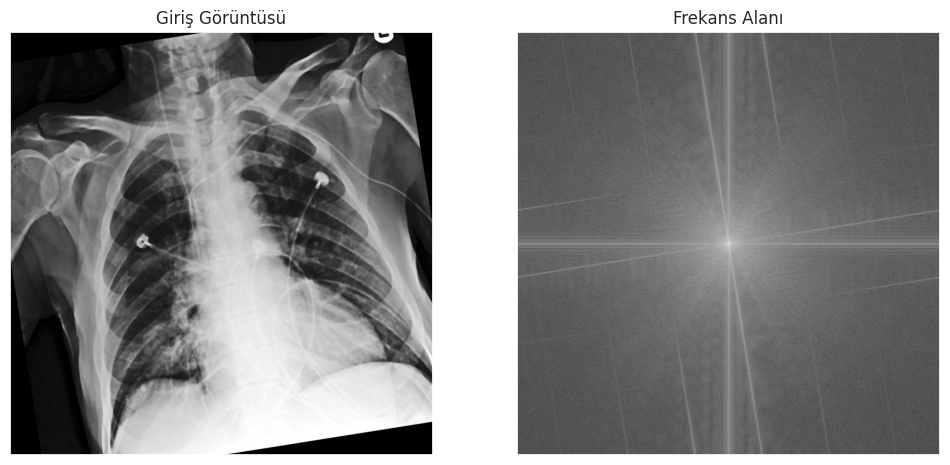

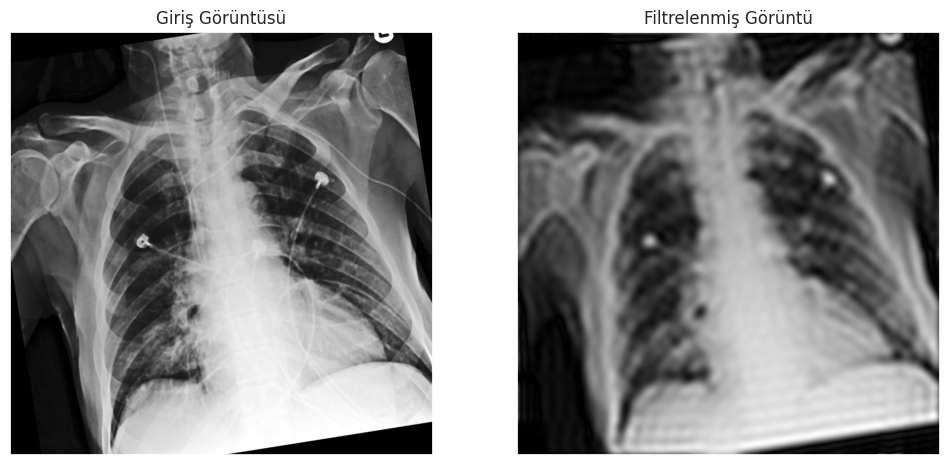

In [ ]:
# prompt: Fourier dönüşümü ile görüntüyü frekans alanına çevirin, düşük frekansları geçiren bir maske uygulayın, ardından ters Fourier dönüşümü ile frekans alanında filtreleme yapın.


for idx, frequencyimage in enumerate(rotated_images):

  # Görüntüyü gri tonlamalı olarak yükleyin
  img = frequencyimage

  # Fourier dönüşümünü hesaplayın
  dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
  dft_shift = np.fft.fftshift(dft)

  # Frekans alanında görüntüyü gösterin
  magnitude_spectrum = 20 * np.log(cv2.magnitude(dft_shift[:, :, 0], dft_shift[:, :, 1]))
  plt.figure(figsize=(12, 6))
  plt.subplot(121), plt.imshow(img, cmap='gray')
  plt.title('Giriş Görüntüsü'), plt.xticks([]), plt.yticks([])
  plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray')
  plt.title('Frekans Alanı'), plt.xticks([]), plt.yticks([])
  plt.show()

  # Düşük frekansları geçiren bir maske oluşturun
  rows, cols = img.shape
  crow, ccol = rows // 2, cols // 2
  mask = np.zeros((rows, cols, 2), np.uint8)
  mask[crow - 30:crow + 30, ccol - 30:ccol + 30] = 1

  # Maskeyi frekans alanına uygulayın
  fshift = dft_shift * mask

  # Ters Fourier dönüşümünü hesaplayın
  f_ishift = np.fft.ifftshift(fshift)
  img_back = cv2.idft(f_ishift)
  img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

  # Filtrelenmiş görüntüyü gösterin
  plt.figure(figsize=(12, 6))
  plt.subplot(121), plt.imshow(img, cmap='gray')
  plt.title('Giriş Görüntüsü'), plt.xticks([]), plt.yticks([])
  plt.subplot(122), plt.imshow(img_back, cmap='gray')
  plt.title('Filtrelenmiş Görüntü'), plt.xticks([]), plt.yticks([])
  plt.show()

**Keskinleştirme ve Enterpolasyon**

---

Keskinleştirme, Unsharp masking tekniği kullanarak görüntüyü keskinleştirin.\
Bicubic Enterpolasyon, Keskinleştirilmiş görüntüyü iki kat büyüterek enterpolasyon uygulayın.


---

**Yorum**

---


Orijinal Görüntü:
herhangi bir işleme tabi tutulmamış ham göğüs röntgenidir.
Piksel yoğunlukları doğal haldedir ve detaylar belirgin değildir.
Görüntü, ham haliyle üst üste binen dokular ve düşük kontrast nedeniyle tanısal olarak sınırlı bilgi sunar.

Keskinleştirilmiş Görüntü:
unsharp masking yöntemi kullanılarak keskinleştirilmiştir.
Bu işlem, görüntünün kenar ayrıntılarını ve doku farklarını belirginleştirmiştir.
Özellikle kaburga sınırları ve akciğer yapılarının netliği artırılmıştır.

Boyut Artırımı (Bicubic Enterpolasyon):
Görüntü, boyut artırımı yapılarak orijinalinden yaklaşık iki kat daha büyük hale getirilmiştir.
Bicubic enterpolasyon yöntemi kullanılarak detay kaybı minimize edilmiştir.
Bu adım, ince detayların daha net görülmesini sağlamak amacıyla yapılmıştır.

Görüntü Karşılaştırması:
Sağdaki keskinleştirilmiş ve büyütülmüş görüntüler, tanısal detayların vurgulanması açısından avantaj sağlar.
Kontrast ve netlik artışı, patolojik detayların (örneğin, infiltrasyonlar, nodüller) daha kolay tespit edilmesine yardımcı olabilir.
Orijinal görüntüye kıyasla, sağlık uzmanlarının daha etkili değerlendirme yapmasına olanak tanır.

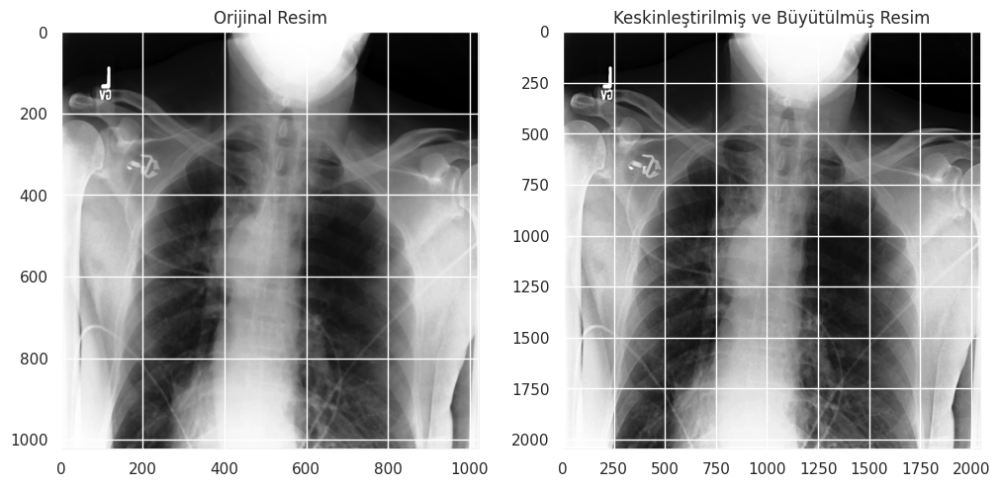

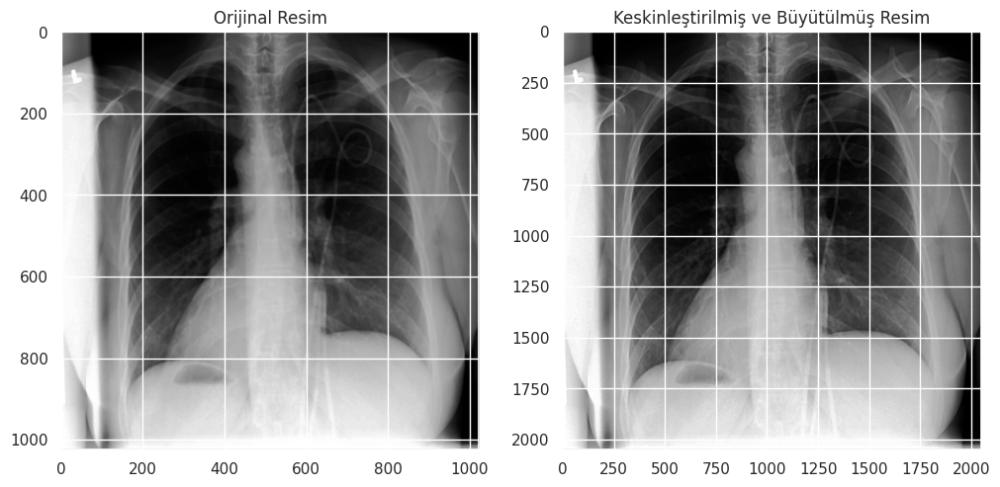

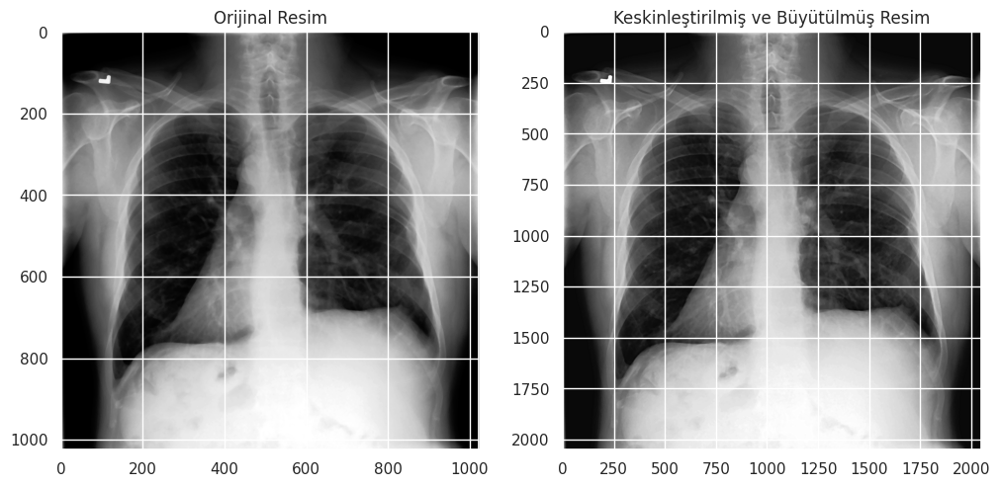

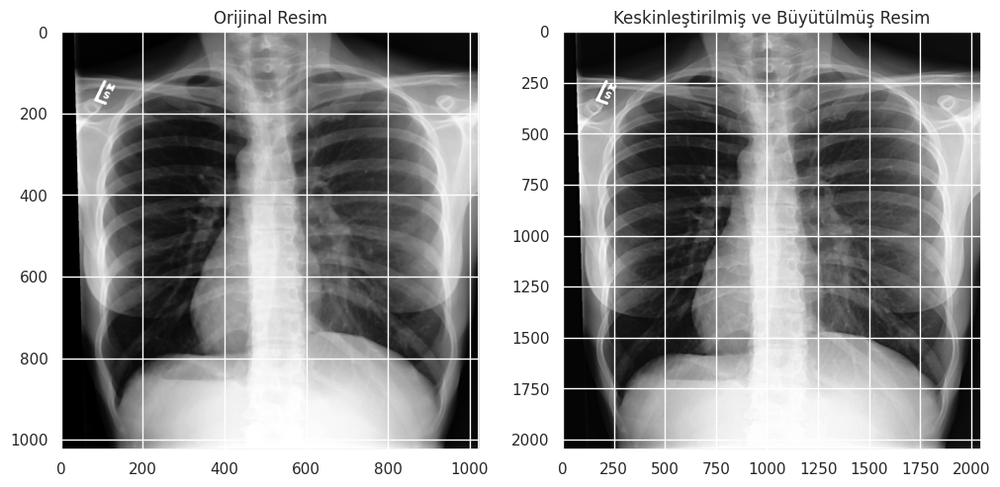

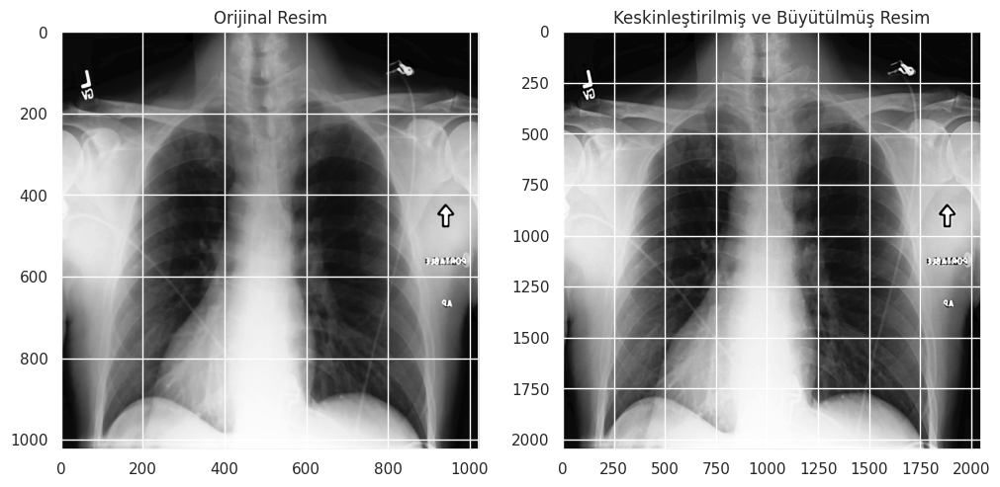

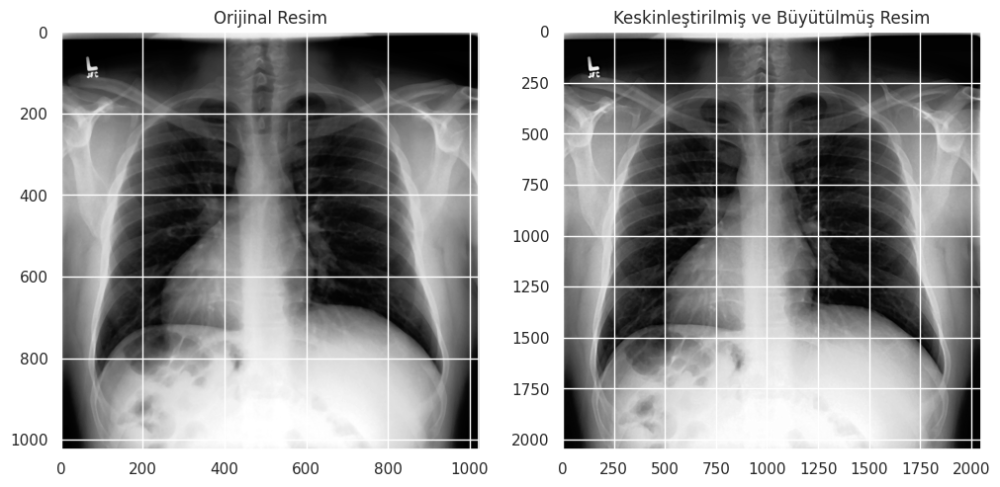

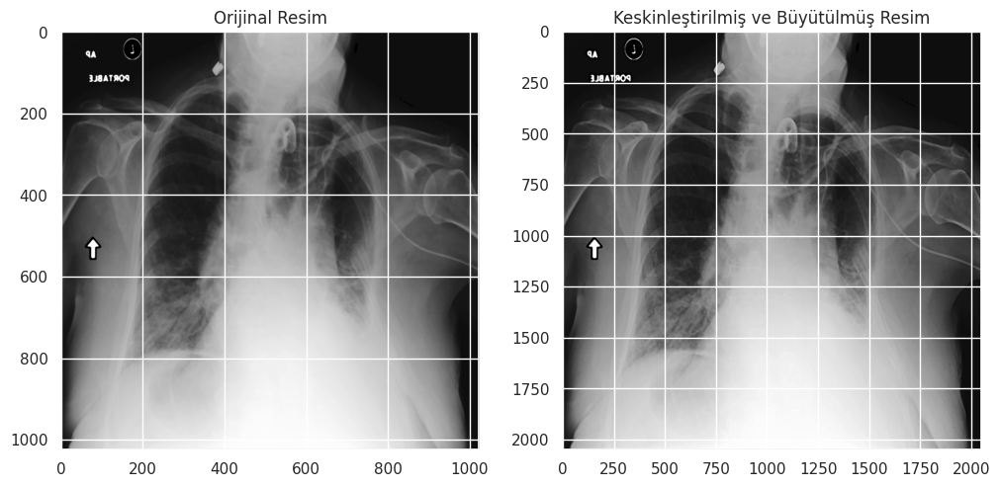

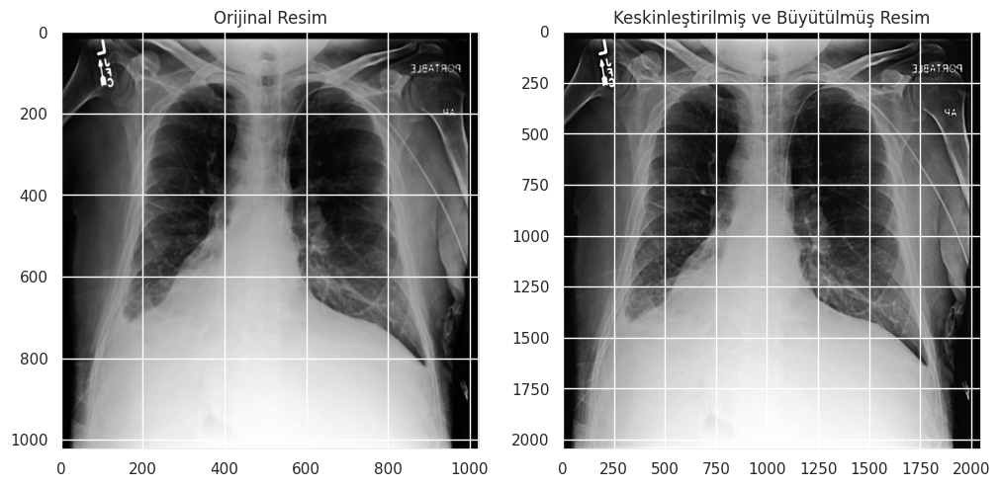

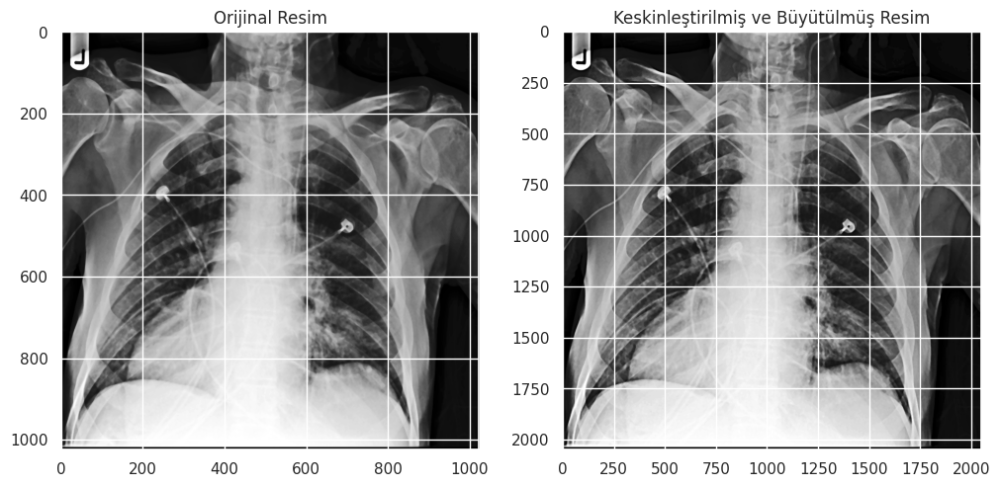

In [ ]:
for idx, image in enumerate(flipped_images):
  # Keskinleştirme (Unsharp Masking)
  blurred_image = cv2.GaussianBlur(image, (0, 0), 3)
  sharpened_image = cv2.addWeighted(image, 1.5, blurred_image, -0.5, 0)


  # Bicubic Enterpolasyon ile iki kat büyütme
  new_width = int(image.shape[1] * 2)
  new_height = int(image.shape[0] * 2)
  resized_image = cv2.resize(sharpened_image, (new_width, new_height), interpolation=cv2.INTER_CUBIC)

  # Sonuçları gösterme
  plt.figure(figsize=(12, 6))

  plt.subplot(1, 2, 1)
  plt.imshow(image, cmap='gray')
  plt.title('Orijinal Resim')

  plt.subplot(1, 2, 2)
  plt.imshow(resized_image, cmap='gray')
  plt.title('Keskinleştirilmiş ve Büyütülmüş Resim')

  plt.show()

**Sayısal Görüntü İşleme Çalışması ile ilgili Genel Yorum**

Veri Hazırlama ve Görselleştirme:

Çalışma, göğüs röntgeni görüntülerine ait bir veri kümesini kullanarak yapılmıştır. Veri setinde, her bir görüntüyle ilişkili olarak hastalık durumunu belirten etiketler bulunmaktadır.
Veri setinin incelenmesi sırasında, pozitif (1) ve negatif (0) etiketlerin dağılımı kontrol edilmiştir. Bu dağılım, veri setinin dengeli olup olmadığını anlamak için önemlidir. Çalışmada, sınıflar arasında dengesizlik gözlemlenmiştir; örneğin, bazı hastalık kategorileri yalnızca birkaç örnek içerirken diğerleri daha fazla örneğe sahiptir.
İstatistiksel Analiz ve Görselleştirme:

Görsellerin piksel değerlerine ait istatistiksel özellikler (maksimum, minimum, ortalama, standart sapma) analiz edilmiştir.
Histogramlar, piksel değerlerinin dağılımını ve kontrastını görselleştirmek için kullanılmıştır. Bu adımlar, görüntülerdeki potansiyel bilgi kayıplarını veya gürültüyü değerlendirmek için faydalıdır.
Görüntü İşleme Teknikleri:

Kontrast Germe: Görsellerdeki kontrast oranı artırılarak ayrıntılar daha belirgin hale getirilmiştir.
Histogram Eşitleme: Piksel değerlerinin daha eşit bir şekilde dağılması sağlanmıştır. Bu işlem, özellikle düşük kontrastlı görüntülerde faydalıdır.
Gama Düzeltmesi: Görsellerin parlaklık seviyeleri, belirli bir gama değeri kullanılarak optimize edilmiştir.
Gürültü Azaltma:

Gürültü azaltma işlemleri için median ve Gaussian filtreler uygulanmıştır. Median filtre, noktasal gürültüyü azaltmada etkili olurken Gaussian filtre, genel görüntü yumuşatma işlemi için kullanılmıştır.
Veri Çeşitlendirme:

Görseller rastgele açılarda döndürülmüş ve yatay olarak çevrilmiştir. Bu işlem, veri çeşitliliğini artırmak ve modeli daha genel hale getirmek için yapılmıştır.
Frekans Alanında Filtreleme:

Fourier dönüşümü ile görseller frekans alanına çevrilmiş, ardından düşük frekansları geçiren bir maske uygulanmıştır. Bu adım, görüntüdeki önemli yapısal bilgileri korurken gürültüyü azaltmayı amaçlamaktadır.
Keskinleştirme ve Enterpolasyon:

Görseller, Unsharp Masking yöntemiyle keskinleştirilmiştir. Ayrıca, bicubic enterpolasyon yöntemiyle görüntü boyutları büyütülmüştür. Bu işlemler, görüntülerin detaylarını artırmak ve analiz için daha uygun hale getirmek için yapılmıştır.
Öne Çıkan Sonuçlar ve Öneriler
Dengesizlik: Veri setindeki sınıf dengesizlikleri, modelin bazı hastalıkları yeterince öğrenememesine neden olabilir. Bu dengesizlik, veri artırma veya örnekleme yöntemleriyle giderilmelidir.
Görüntü İşleme: Uygulanan görüntü işleme adımları, görsellerin tanısal değerini artırmıştır. Ancak, bu işlemlerin model performansına olan etkisi eğitim ve test aşamalarında değerlendirilmeli.
Görselleştirme: Histogramlar ve frekans alanı analizleri, görüntü kalitesini ve bilgiyi değerlendirmede etkili araçlar olarak kullanılmıştır.
Eğer bu işlemlerin çıktıları veya model sonuçları analiz edildiyse, bu verilere göre daha detaylı çıkarımlar yapılabilir.